# **INTRODUCTION**
Laporan insiden kejahatan disediakan oleh Departemen Kepolisian Boston (BPD) untuk mendokumentasikan rincian awal seputar insiden yang ditanggapi oleh petugas BPD. Ini adalah kumpulan data yang berisi catatan dari sistem laporan insiden kejahatan terbaru, yang difokuskan untuk menangkap jenis insiden serta kapan dan di mana itu terjadi.

# **BUSINESS UNDERSTANDING**
Sebagai seorang *data analyst*, kita akan mencoba menjawab pertanyaan berikut:

- Jenis kejahatan apa yang paling umum?
- Apakah jumlah kejahatan berubah dari hari ke hari? Bulan? Tahun?
- Di mana berbagai jenis kejahatan paling mungkin terjadi?


In [1]:
# data analysis and wrangling
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import normaltest, chi2_contingency, mannwhitneyu, ttest_ind
import re

# visualization
import seaborn as sns
import plotly.express as px

# **DATA UNDERSTANDING**
Untuk menjawab pertanyaan di atas, kita akan menganalisa data pelaporan kejadian kriminal dari Boston Police Department. Dataset dapat diakses [di sini](https://drive.google.com/drive/folders/1uPzXi8Qkf_lSxs7UbTAANxZwGe2PzREm). 

In [2]:
df= pd.read_csv('crime.csv', encoding='latin-1')

Berikut 5 baris teratas dari dataset crime.

In [3]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


Dataset ini berisi informasi terkait jenis, waktu dan tempat terjadinya insiden kejahatan yang diisi berdasarkan laporan Boston Police Department. Ada 17 kolom di dalam dataset crime, yaitu:  

* **INCIDENT_NUMBER**       : Nomor pelaporan internal dari Boston Police Department (BPD)
* **OFFENSE_CODE**          : Kode numerikal dari **OFFENSE_DESCRIPTION**
* **OFFENSE_CODE_GROUP**    : Kategorisasi internal BPD untuk setiap jenis kejahatan
* **OFFENSE_DESCRIPTION**   : Deskripsi utama kejahatan
* **DISTRICT**              : Distrik/wilayah dimana kejahatan tersebut dilaporkan
* **REPORTING_AREA**        : Nomor Area yang diasosiasikan dengan area dimana kejahatan tersebut dilaporkan.
* **SHOOTING**              : Indikasi terjadinya penembakan
* **OCCURRED_ON_DATE**      : Tanggal dan waktu awal terjadinya insiden kejahatan
* **YEAR**                  : Tahun terjadinya kejadian
* **MONTH**                 : Bulan terjadinya kejadian
* **DAY_OF_WEEK**           : Nama hari terjadinya kejadian
* **HOUR**                  : Jam terjadinya kejadian
* **UCR_PART**              : Universal Crime Reporting Part number (1, 2, 3)
* **STREET**                : Nama jalan tempat terjadinya kejadian
* **Lat**                   : Garis lintang tempat terjadinya kejadian
* **Long**                  : Garis bujur tempat terjadinya kejadian
* **Location**              : Kombinasi garis lintang dan garis bujur


Kolom yang merupakan variabel kuantitatif yaitu :
- Continue : **Lat, Long**
- Discrite : **OFFENSE_CODE, YEAR, MONTH, HOUR**

Secara umum, kita bisa melihat bahwa:
* **OFFENSE_CODE** merupakan data numerikal yang merepresentasikan jenis insiden kejahatan
* **YEAR, MONTH**, dan **HOUR** merupakan data numerikal yang merepresentasikan waktu terjadinya insiden kejahatan
* Berdasarkan data **YEAR**, tahun terjadinya kejadian berkisar antara 2015 - 2018
* **MONTH** dari 1 - 12 mewakili bulan Januari - Desember
* Nilai **HOUR** 0 mewakili kejadian yang terjadi pada pukul 00:00:00 - 00:59:59, 1 mewakili 01:00:00 - 01:59:59, dst
* **Lat** dan **Long** merupakan data numerikal yang merepresentasikan tempat terjadinya insiden kejahatan
* Nilai **Lat** mayoritas terdistribusi di angka 40-an
* Nilai **Long** mayoritas terdistribusi di angka (-70)-an
* Nilai minimal **Lat** adalah -1 sedangkan nilai maksimal **Long** adalah -1 (outlier)


In [4]:
df.describe()

,OFFENSE_CODE,YEAR,MONTH,HOUR,Lat,Long
count,319073.000000,319073.000000,319073.000000,319073.000000,299074.000000,299074.000000
mean,2317.546956,2016.560586,6.609719,13.118205,42.214381,-70.908272
std,1185.285543,0.996344,3.273691,6.294205,2.159766,3.493618
min,111.000000,2015.000000,1.000000,0.000000,-1.000000,-71.178674
25%,1001.000000,2016.000000,4.000000,9.000000,42.297442,-71.097135
50%,2907.000000,2017.000000,7.000000,14.000000,42.325538,-71.077524
75%,3201.000000,2017.000000,9.000000,18.000000,42.348624,-71.062467
max,3831.000000,2018.000000,12.000000,23.000000,42.395042,-1.000000


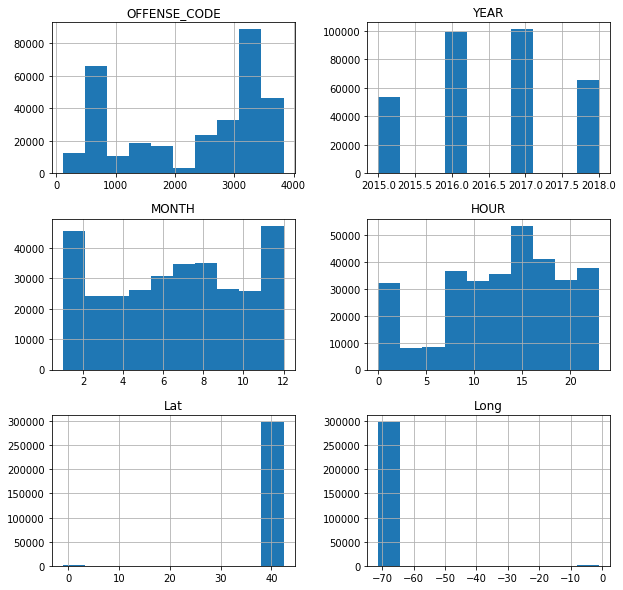

In [5]:
df.hist(figsize=(10,10));

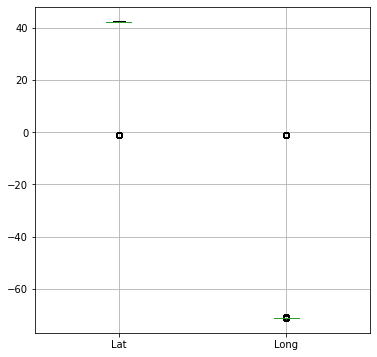

In [6]:
df.boxplot(['Lat','Long'], figsize=(6,6));

Kolom yang merupakan variabel kualitatif yaitu :
- Nominal : **INCIDENT_NUMBER, OFFENSE_CODE_GROUP, OFFENSE_DESCRIPTION, DISTRICT, REPORTING_AREA, SHOOTING, DAY_OF_WEEK, STREET, Location**
- Ordinal : **OCCURED_ON_DATE, UCR_PART**

Secara umum, kita bisa melihat bahwa:

* Tidak ada dataset yang sepenuhnya unik (count = unique), setiap kolom memiliki nilai duplikat.
* **INCIDENT_NUMBER** yang sama bisa saja terdiri dari beberapa jenis insiden kejahatan yang berbeda.
* 'Motor Vehicle Accident Response' merupakan nilai yang paling sering muncul pada kolom **OFFENSE_CODE_GROUP**
* 'SICK/INJURED/MEDICAL - PERSON' merupakan nilai yang paling sering muncul pada kolom **OFFENSE_DESCRIPTION**
* Terdapat 12 kode district yang menjadi wilayah cakupan Boston Police Department pada kolom **DISTRICT**
* Whitespace characters merupakan data yang paling sering muncul dalam **REPORTING_AREA** sebanyak 20.250 baris
* Hanya terdapat 1 macam nilai untuk kategori **SHOOTING** yaitu Y (terjadi penembakan)
* **OCCURED_ON_DATE** berisi data tanggal dan waktu dengan format 'yyyy-mm-dd hh:mm:ss'
* Terdapat 7 nilai pada **DAY_OF_WEEK** sesuai nama hari.
* Terdapat 4 kategori pada **UCR_PART**
* 'WASHINGTON ST' merupakan nilai yang paling sering muncul pada kolom **STREET**
* Location merupakan gabungan dari data pada kolom **Lat** dan **Long** dengan nilai yang paling sering muncul yaitu '(0.00000000, 0.00000000)'

In [7]:
df.describe(include='object')

,INCIDENT_NUMBER,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,DAY_OF_WEEK,UCR_PART,STREET,Location
count,319073,319073,319073,317308,319073,1019,319073,319073,318983,308202,319073
unique,282517,67,244,12,879,1,233229,7,4,4657,18194
top,I162030584,Motor Vehicle Accident Response,SICK/INJURED/MEDICAL - PERSON,B2,,Y,2017-06-01 00:00:00,Friday,Part Three,WASHINGTON ST,"(0.00000000, 0.00000000)"
freq,13,37132,18783,49945,20250,1019,29,48495,158553,14194,19999


Informasi lebih detail mengenai struktur DataFrame dapat dilihat sebagai berikut:
- DataFrame terdiri dari 319073 baris dan 17 kolom
- 4 kolom berupa integer dan 2 kolom berupa float
- 11 kolom berupa strings (object).
- Terdapat 6 kolom yang memiliki data null yaitu **DISTRICT, SHOOTING, UCR_PART, STREET, Lat,** dan **Long**

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319073 entries, 0 to 319072
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   INCIDENT_NUMBER      319073 non-null  object 
 1   OFFENSE_CODE         319073 non-null  int64  
 2   OFFENSE_CODE_GROUP   319073 non-null  object 
 3   OFFENSE_DESCRIPTION  319073 non-null  object 
 4   DISTRICT             317308 non-null  object 
 5   REPORTING_AREA       319073 non-null  object 
 6   SHOOTING             1019 non-null    object 
 7   OCCURRED_ON_DATE     319073 non-null  object 
 8   YEAR                 319073 non-null  int64  
 9   MONTH                319073 non-null  int64  
 10  DAY_OF_WEEK          319073 non-null  object 
 11  HOUR                 319073 non-null  int64  
 12  UCR_PART             318983 non-null  object 
 13  STREET               308202 non-null  object 
 14  Lat                  299074 non-null  float64
 15  Long             

Informasi lebih detail data unik pada setiap kolom dapat dilihat sebagai berikut:

In [9]:
pd.set_option('display.max_colwidth', None)
# data uni di tiap kolom
listItem = []
for col in df.columns :
    listItem.append( [col, df[col].nunique(), df.sort_values(col)[col].unique()])

tabel1Desc = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
tabel1Desc

,Column Name,Number of Unique,Unique Sample
0,INCIDENT_NUMBER,282517,"[142052550, I010370257-00, I030217815-08, I050310906-00, I060168073-00, I080542626-00, I090317057-00, I090321958-00, I100033064-00, I100222105-02, I100340225-00, I100636670-00, I110177502-00, I110261417-00, I110372326-00, I110551302-00, I110611058-00, I110694557-00, I120069826-00, I120189428-00, I120201612-00, I120260724-01, I120283195-00, I120470733-00, I120595668-00, I120719309-00, I120720047-00, I130007264-01, I130031413-00, I130041200-00, I130084703-00, I130126035-00, I130194606-00, I130202615-00, I130204032-00, I130304171-00, I130325877-00, I130371627-00, I130452692-00, I130513834-00, I130559249-00, I130626822-00, I130634867-00, I130731947-00, I130739503-00, I130769339-00, I130789976-00, I140036361-00, I140039570-00, I140041532-00, I140042060-00, I140056633-00, I140110321-00, I140148421-00, I140160427-01, I140173500-00, I140188130-00, I140254285-00, I140295154-00, I140300475-02, I140311903-00, I140319608-00, I140346143-00, I140356025-00, I140372066-00, I142002101-00, I142004681-00, I142010194-00, I142013220-00, I142014620-00, I142016089-00, I142017108-00, I142020701-00, I142020933-00, I142022633-00, I142023661-00, I142024796-00, I142025834-00, I142025900-00, I142029747-00, I142032469-00, I142033071-00, I142033219-00, I142034820-00, I142035471-00, I142036405-00, I142039468-00, I142041046-00, I142041685-01, I142042232-00, I142044610-00, I142045442-00, I142045856-00, I142045979-00, I142048539-00, I142049917-00, I142050174-00, I142050207-00, I142051855-00, I142052022-00, ...]"
1,OFFENSE_CODE,222,"[111, 112, 121, 123, 301, 311, 315, 334, 335, 338, 339, 349, 351, 361, 371, 381, 402, 403, 404, 413, 423, 432, 511, 520, 521, 522, 527, 530, 540, 541, 542, 547, 560, 561, 562, 611, 612, 613, 614, 615, 616, 617, 618, 619, 623, 624, 627, 629, 633, 634, 637, 639, 670, 706, 714, 724, 727, 735, 770, 801, 802, 803, 804, 900, 1001, 1002, 1102, 1105, 1106, 1107, 1108, 1109, 1201, 1300, 1302, 1304, 1402, 1415, 1501, 1502, 1503, 1504, 1510, 1601, 1602, 1603, 1605, 1610, 1620, 1805, 1806, 1807, 1810, 1815, 1825, 1830, 1831, 1832, 1841, 1842, ...]"
2,OFFENSE_CODE_GROUP,67,"[Aggravated Assault, Aircraft, Arson, Assembly or Gathering Violations, Auto Theft, Auto Theft Recovery, Ballistics, Biological Threat, Bomb Hoax, Burglary - No Property Taken, Commercial Burglary, Confidence Games, Counterfeiting, Criminal Harassment, Disorderly Conduct, Drug Violation, Embezzlement, Evading Fare, Explosives, Fire Related Reports, Firearm Discovery, Firearm Violations, Fraud, Gambling, HOME INVASION, HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, Harassment, Harbor Related Incidents, Homicide, INVESTIGATE PERSON, Investigate Person, Investigate Property, Landlord/Tenant Disputes, Larceny, Larceny From Motor Vehicle, License Plate Related Incidents, License Violation, Liquor Violation, Manslaughter, Medical Assistance, Missing Person Located, Missing Person Reported, Motor Vehicle Accident Response, Offenses Against Child / Family, Operating Under the Influence, Other, Other Burglary, Phone Call Complaints, Police Service Incidents, Prisoner Related Incidents, Property Found, Property Lost, Property Related Damage, Prostitution, Recovered Stolen Property, Residential Burglary, Restraining Order Violations, Robbery, Search Warrants, Service, Simple Assault, Towed, Vandalism, Verbal Disputes, Violations, Warrant Arrests]"
3,OFFENSE_DESCRIPTION,244,"[A&B HANDS, FEET, ETC. - MED. ATTENTION REQ., A&B ON POLICE OFFICER, ABDUCTION - INTICING, AFFRAY, AIRCRAFT INCIDENTS, ANIMAL ABUSE, ANIMAL CONTROL - DOG BITES - ETC., ANIMAL INCIDENTS, ANNOYING AND ACCOSTIN, ANNOYING AND ACCOSTING, ARSON, ASSAULT & BATTERY, ASSAULT & BATTERY D/W - KNIFE, ASSAULT & BATTERY D/W - OTHER, ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER, ASSAULT - AGGRAVATED, ASSAULT - AGGRAVATED - BATTERY, ASSAULT - SIMPLE, ASSAULT D/W - KNIFE ON POLICE OFFICER, ASSAULT D/W - OTHER, ASSAULT SIMPLE - BATTERY, AUTO THEFT, 

In [10]:
# mengecek padanan HOME INVASION pada OFFENSE_DESCRIPTION
words_list = list(df['OFFENSE_DESCRIPTION'].unique())

[word for word in words_list if 'HOME INVASION' in word]


['HOME INVASION', 'ROBBERY - HOME INVASION']

Dari unique sample di atas dapat dilihat :
* Secara umum format penulisan **INCIDENT_NUMBER** diawali oleh huruf 'I' dan mengikuti pola 'I\d{9}(-\d{2})?', namun kita melihat ada nilai '142052550' yang berbeda penulisannya
* **OFFENSE_CODE_GROUP** umumnya ditulis dengan huruf kapital di awal kata, namun kita melihat ada penulisan yang berbeda untuk nilai 'HOME INVASION', 'HUMAN TRAFFICKING', 'HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE', dan 'INVESTIGATE PERSON'.
* Pada kolom **OFFENSE_DESCRIPTION** terdapat nilai yang juga memuat kata 'HOME INVASION' yaitu 'ROBBERY - HOME INVASION' dan 'HOME INVASION'
* **DISTRICT** berisi kode district A1, A15, A7, B2, B3, C11, C6, D14, D4, E13, E18, dan E5 (bukan nama district)
* Pada **REPORTING_AREA** terdapat kolom yang berisi whitespace dan juga kode area '000'
* Kolom **SHOOTING** hanya berisi 'Y' dan nan.
* Kolom **YEAR, MONTH, DAY_OF_WEEK**, dan **HOUR** sudah konsisten dari format penulisan dan tidak ada nilai yang aneh/inkonsisten.
* **UCR_PART** memiliki nilai 'Other', 'Part One', 'Part Three', 'Part Two' dan juga nan.
* Terdapat kolom **Location** yang berisi nilai (-1.00000000, -1.00000000) dan (0.00000000, 0.00000000)

Berdasarkan seluruh informasi di atas, maka beberapa hal yang akan dilakukan untuk tiap kolom di antaranya adalah :

`SELURUH KOLOM`
- ALL-1 : Menghapus data duplikat (Baris data yang memiliki nilai yang sama persis untuk tiap kolomnya)

`INCIDENT_NUMBER`
- IN-1 : Mengecek konsistensi format penulisan Incident Number
- IN-2 : Mengubah format penulisan Incident Number yang tidak sesuai

`OFFENSE_CODE & OFFENSE_DESCRIPTION`
- OC-1 : Mengecek apakah 1 offense code mewakili 1 offense description
- OC-2 : Menyesuaikan offense description dengan offense code agar konsisten
- OC-3 : Mengubah 'HOME INVASION' menjadi 'ROBBERY - HOME INVASION' karena keduanya diasumsikan merupakan jenis pelanggaran yang sama

`OFFENSE_CODE_GROUP`
- OCG-1 : Mengubah HOME INVASION menjadi Robbery
- OCG-2 : Mengubah penulisan HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, dan INVESTIGATE PERSON dari huruf besar semua menjadi huruf besar di awal kata.

`REPORTING_AREA`
- RA-1 : Mengecek area 000 dan mengubah menjadi nan
- RA-2 : Mengganti whitespace menjadi nan

`DISTRICT`
- D-1 : Mengubah kode district menjadi nama district agar lebih mudah dipahami orang awam sesuai dengan [ini](https://bpdnews.com/districts)

`Lat, Long`
- L-1 : Memastikan nilai Lat dan Long konsisten dengan nilai pada Location
- L-2 : Mengubah nilai Lat, Long yang sama dengan -1.0 (outlier) menjadi nan

`Location`
- Loc-1 : Mengubah nilai Location yang sama dengan (-1.00000000, -1.00000000) dan (0.00000000, 0.00000000) menjadi nan

`DISTRICT, REPORTING_AREA, STREET, Location`
- DRAS-1 : Mengingat keempat kolom ini merupakan informasi penting terkait lokasi, maka jika keempatnya nan, data akan dihapus.
- DRAS-2 : Mengisi atau menghapus missing values

`SHOOTING`
- S-1 :  Mengingat shooting merupakan indikasi terjadinya penembakan dimana kemungkinan hanya ada pilihan 'Iya' dan 'Tidak', maka nilai nan diasumsikan tidak ada penembakan sehingga akan diubah menjadi 'N'.

`OCCURED_ON_DATE`
- OOD-1 : Memastikan format penulisannya konsisten dengan pola 'yyyy-mm-dd hh:mm:ss'
- OOD-2 : Memastikan nilai YEAR, MONTH, dan HOUR konsisten dengan nilai pada OCCURED_ON_DATE
- OOD-3 : Mengubah tipe data OCCURED_ON_DATE menjadi datetime

`UCR_PART`
- UCR-1 : Memastikan pengklasifikasian UCR sesuai dengan [FBI](https://www2.fbi.gov/ucr/cius_04/appendices/appendix_02.html) dimana umumnya dibagi ke Part One, Part Two, dan Part Three (untuk pelanggaran selain Part I dan Part II)
- UCR-2 : Mengisi atau menghapus missing values

`KOLOM BARU`
- TIME : Mengelompokan waktu berdasarkan jam menjadi Morning (4:00 - 11:59), Afternoon (12:00 - 19:59), dan Night (20:00 - 3:59)
- WEEK : Mengelompokan hari  menjadi Weekday (Monday - Friday) dan Weekend (Saturday - Sunday)







# **DATA PREPARATION AND CLEANING**

Data Preparation and Cleaning diperlukan untuk memastikan kebenaran, konsistensi, dan kegunaan suatu data yang ada dalam dataset. Caranya adalah dengan mendeteksi adanya error atau corrupt pada data, kemudian memperbaiki atau menghapus data jika memang diperlukan.

Sesuai dengan hasil penelaahan pada bagian Data Understanding di atas, maka beberapa tahap yang akan kita lakukan di antaranya yaitu :

### *MENGHAPUS DUPLIKAT DATA*

- ALL-1 : Menghapus data duplikat (Baris data yang memiliki nilai yang sama persis untuk tiap kolomnya)

Pada dataset di crime, terdapat data duplikat dengan contoh sebagai berikut :

In [11]:
# menghitung banyaknya duplikat dan menampilkan 6 baris contoh data duplikat
display(f'Data duplikat sebanyak {df.duplicated().sum()} pasang', df[df.duplicated(keep=False)].head(6))

'Data duplikat sebanyak 23 pasang'

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
318742,I152030570-00,3125,Warrant Arrests,WARRANT ARREST,E13,303,NaN,2016-10-29 08:25:00,2016,10,Saturday,8,Part Three,W WALNUT PARK,42.317207,-71.098799,"(42.31720702, -71.09879922)"
318745,I152030570-00,3125,Warrant Arrests,WARRANT ARREST,E13,303,NaN,2016-10-29 08:25:00,2016,10,Saturday,8,Part Three,W WALNUT PARK,42.317207,-71.098799,"(42.31720702, -71.09879922)"
318751,I152026775-00,3115,Investigate Person,INVESTIGATE PERSON,C6,936,NaN,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)"
318752,I152026775-00,3115,Investigate Person,INVESTIGATE PERSON,C6,936,NaN,2015-10-19 16:04:00,2015,10,Monday,16,Part Three,ORTON-MAROTTA WAY,42.338573,-71.055755,"(42.33857289, -71.05575501)"
318754,I152026488-00,3125,Warrant Arrests,WARRANT ARREST,A1,105,NaN,2017-01-31 10:00:00,2017,1,Tuesday,10,Part Three,FRUIT ST,42.362403,-71.069547,"(42.36240281, -71.06954652)"
318755,I152026488-00,3125,Warrant Arrests,WARRANT ARREST,A1,105,NaN,2017-01-31 10:00:00,2017,1,Tuesday,10,Part Three,FRUIT ST,42.362403,-71.069547,"(42.36240281, -71.06954652)"


In [12]:
# menghapus duplikat
df = df.drop_duplicates().reset_index().drop(columns='index')
print(f'Sebelumnya kita memiliki 319073 baris data, sekarang kita memiliki {len(df)} baris')


Sebelumnya kita memiliki 319073 baris data, sekarang kita memiliki 319050 baris


### *MEMPERBAIKI KESALAHAN STRUKTUR*

Pada tahapan ini kita akan mengecek dan melakukan perbaikan apabila menemukan penamaan yang aneh, typo, dll

- IN-1 : Mengecek konsistensi format penulisan Incident Number

In [13]:
# mengecek nilai pada kolom INCIDENT_NUMBER yang tidak di awali 'I'

n_baris = len(df[df['INCIDENT_NUMBER'].str.contains('I') == False])
print(f"Terdapat {n_baris} baris yang tidak diawali huruf 'I'")
print(f'Hal ini setara dengan {n_baris/len(df) * 100:.4f} % data')

Terdapat 1 baris yang tidak diawali huruf 'I'
Hal ini setara dengan 0.0003 % data


In [14]:
# mengecek nilai pada kolom INCIDENT_NUMBER yang berbentuk 'I\d{9}-\d{2}'

n_baris = len(df[df['INCIDENT_NUMBER'].str.contains('I\d{9}-\d{2}')])
print(f"Terdapat {n_baris} baris yang memiliki pola 'I' diikuti 9 digit angka kemudian '-' dan 2 digit angka'")
print(f'Hal ini setara dengan {n_baris/len(df) * 100:.4f} % data')

Terdapat 330 baris yang memiliki pola 'I' diikuti 9 digit angka kemudian '-' dan 2 digit angka'
Hal ini setara dengan 0.1034 % data


Karena jumlah baris yang tidak diawali huruf 'I' hanya ada 1 dan jumlah baris yang berbentuk 'I\d{9}-\d{2}' hanya ada 330 baris, dimana jumlah tersebut hanya mewakili 0.1037% data.

Sedangkan mayoritas data diawali huruf 'I' dan diikuti 9 digit angka ('I\d{9}'), maka 331 baris tersebut akan disesuaikan formatnya.

- IN-2 : Mengubah format penulisan Incident Number yang tidak sesuai

In [15]:
# mengubah '142052550' menjadi 'I142052550'

df['INCIDENT_NUMBER'] = df['INCIDENT_NUMBER'].replace(['142052550'],'I142052550')
df[df['INCIDENT_NUMBER'].str.contains('142052550')]



,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
319049,I142052550,3125,Warrant Arrests,WARRANT ARREST,D4,903,NaN,2015-06-22 00:12:00,2015,6,Monday,0,Part Three,WASHINGTON ST,42.333839,-71.08029,"(42.33383935, -71.08029038)"


In [16]:
# mengambil 10 karakter pertama pada kolom INCIDENT_NUMBER sehingga nilai konsisten berbentuk 'I\d{9}'

df['INCIDENT_NUMBER'] = df['INCIDENT_NUMBER'].apply(lambda string : string[:10])
df[df['INCIDENT_NUMBER'].str.contains('I\d{9}')].sample(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
119668,I172050804,3803,Motor Vehicle Accident Response,M/V ACCIDENT - PERSONAL INJURY,C11,362,NaN,2017-06-24 20:06:00,2017,6,Saturday,20,Part Three,WASHINGTON ST,42.291823,-71.071734,"(42.29182298, -71.07173417)"
36196,I182032037,614,Larceny From Motor Vehicle,LARCENY THEFT FROM MV - NON-ACCESSORY,B2,584,NaN,2018-04-28 19:30:00,2018,4,Saturday,19,Part One,LAWN ST,42.327016,-71.105551,"(42.32701648, -71.10555088)"
146556,I172021931,3114,Investigate Property,INVESTIGATE PROPERTY,B2,589,NaN,2017-03-20 22:16:00,2017,3,Monday,22,Part Three,ANNUNCIATION RD,42.335157,-71.094775,"(42.33515685, -71.09477470)"
236275,I162032086,3130,Search Warrants,SEARCH WARRANT,E5,664,NaN,2016-04-25 13:23:00,2016,4,Monday,13,Part Three,ARCHDALE RD,42.293615,-71.122904,"(42.29361485, -71.12290392)"
256375,I162010436,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,D4,167,NaN,2016-02-08 10:05:00,2016,2,Monday,10,Part Two,E BROOKLINE ST,42.337635,-71.070130,"(42.33763461, -71.07013024)"


- OC-1 : Mengecek apakah 1 offense code mewakili 1 offense description

In [17]:
# menampilkan offense code yang memiliki 2 deskripsi

OC_duplicate = df.groupby(['OFFENSE_CODE','OFFENSE_DESCRIPTION']).count().sort_values(['OFFENSE_CODE','INCIDENT_NUMBER'],ascending=[True, False])['INCIDENT_NUMBER'].to_frame().reset_index()
OC_duplicate[OC_duplicate['OFFENSE_CODE'].duplicated(keep=False)]


,OFFENSE_CODE,OFFENSE_DESCRIPTION,INCIDENT_NUMBER
19,413,ASSAULT - AGGRAVATED - BATTERY,4886
20,413,ASSAULT D/W - OTHER,1
21,423,ASSAULT - AGGRAVATED,2910
22,423,ASSAULT & BATTERY D/W - OTHER ON POLICE OFFICER,1
27,522,BURGLARY - RESIDENTIAL - NO FORCE,2358
28,522,B&E RESIDENCE DAY - NO FORCE,1
31,540,BURGLARY - COMMERICAL - FORCE,912
32,540,B&E NON-RESIDENCE DAY - FORCIBLE,2
34,542,BURGLARY - COMMERICAL - NO FORCE,308
35,542,B&E NON-RESIDENCE DAY - NO FORCE,2


Secara umum kita bisa melihat bahwa offense_code yang sama sebenarnya memiliki deskripsi dengan pengertian yang relatif serupa, namun karena adanya kesalahan pengetikan ataupun perbedaan diksi sehingga seolah-olah tampil sebagai deksripsi yang berbeda.

Kemudian jumlah baris dengan OFFENSE_DESCRIPTION yang berbeda untuk masing-masing duplikat OFFENSE_CODE hanya berjumlah antara 1 - 8 baris dimana jumlah ini lebih sedikit dibandingkan OFFENSE_DESCRIPTION yang utamnya.

Sehingga kita asumsikan bahwa OFFENSE_DESCRIPTION tersebut dapat disamakan dengan OFFENSE_DESCRIPTION yang utamanya (contoh : 'ANNOYING AND ACCOSTIN' menjadi 'ANNOYING AND ACCOSTING', 'DISORDERLY PERSON' menjadi 'DISORDERLY CONDUCT', dst)

- OC-2 : Menyesuaikan offense description dengan offense code agar konsisten

In [18]:
# mengambil nomor kode dan deskripsi yang terbanyak untuk setiap duplikasi OFFENSE_CODE dan menyimpannya dalam list
correct_code = list(OC_duplicate[OC_duplicate['OFFENSE_CODE'].duplicated(keep='last')]['OFFENSE_CODE'])
correct_description = list(OC_duplicate[OC_duplicate['OFFENSE_CODE'].duplicated(keep='last')]['OFFENSE_DESCRIPTION'])
correct_description

['ASSAULT - AGGRAVATED - BATTERY',
 'ASSAULT - AGGRAVATED',
 'BURGLARY - RESIDENTIAL - NO FORCE',
 'BURGLARY - COMMERICAL - FORCE',
 'BURGLARY - COMMERICAL - NO FORCE',
 'LARCENY SHOPLIFTING',
 'LARCENY THEFT FROM MV - NON-ACCESSORY',
 'LARCENY THEFT OF BICYCLE',
 'LARCENY THEFT FROM BUILDING',
 'LARCENY ALL OTHERS',
 'AUTO THEFT - LEASED/RENTED VEHICLE',
 'RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUTSIDE BOSTON)',
 'ASSAULT SIMPLE - BATTERY',
 'FORGERY / COUNTERFEITING',
 'FRAUD - FALSE PRETENSE / SCHEME',
 'WEAPON - FIREARM - CARRYING / POSSESSING, ETC',
 'WEAPON - OTHER - CARRYING / POSSESSING, ETC',
 'PROSTITUTION - COMMON NIGHTWALKER',
 'DRUGS - POSS CLASS A - HEROIN, ETC. ',
 'DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP',
 'CHILD ENDANGERMENT (NO ASSAULT)',
 'VIOL. OF RESTRAINING ORDER W ARREST',
 'DISORDERLY CONDUCT',
 'ANNOYING AND ACCOSTING']

In [19]:
# mengubah deskripsi untuk OFFENSE_CODE yang duplikat dengan deskripsi yang tepat
for code, description in zip(correct_code, correct_description):
    df['OFFENSE_DESCRIPTION'].mask(df['OFFENSE_CODE'] == code, description, inplace=True)

In [20]:
# menampilkan apakah masih ada OFFENSE_CODE dengan OFFENSE_DESCRIPTION yang berbeda
OC_duplicate = df.groupby(['OFFENSE_CODE','OFFENSE_DESCRIPTION']).count().sort_values(['OFFENSE_CODE','INCIDENT_NUMBER'],ascending=[True, False])['INCIDENT_NUMBER'].to_frame().reset_index()
OC_duplicate[OC_duplicate['OFFENSE_CODE'].duplicated(keep=False)]

,OFFENSE_CODE,OFFENSE_DESCRIPTION,INCIDENT_NUMBER


Dapat kita lihat bahwa kini sudah tidak ada OFFENSE_CODE dengan OFFENSE_DESCRIPTION yang berbeda

- OC-3 : Mengubah 'HOME INVASION' menjadi 'ROBBERY - HOME INVASION' karena keduanya diasumsikan merupakan jenis pelanggaran yang sama

In [21]:
# mengubah 'HOME INVASION' menjadi 'ROBBERY - HOME INVASION'
df['OFFENSE_DESCRIPTION'] = df['OFFENSE_DESCRIPTION'].replace(['HOME INVASION'],'ROBBERY - HOME INVASION')

In [22]:
# mengecek apakah masih ada HOME INVASION pada OFFENSE_DESCRIPTION
words_list = list(df['OFFENSE_DESCRIPTION'].unique())
[word for word in words_list if 'HOME INVASION' in word]

['ROBBERY - HOME INVASION']

Dapat kita lihat bahwa kini sudah tidak ada 'HOME INVASION' dalam OFFENSE_DESCRIPTION karena telah kita ubah menjadi 'ROBBERY - HOME INVASION'

- OCG-1 : Mengubah HOME INVASION menjadi Robbery

In [23]:
# mengubah 'HOME INVASION' menjadi 'Robbery'
df['OFFENSE_CODE_GROUP'] = df['OFFENSE_CODE_GROUP'].replace(['HOME INVASION'],'Robbery')

In [24]:
# mengecek apakah masih ada HOME INVASION pada OFFENSE_CODE_GROUP
df[df['OFFENSE_CODE_GROUP'].str.contains('HOME INVASION')]

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


Dapat kita lihat bahwa kini sudah tidak ada 'HOME INVASION' pada OFFENSE_CODE_GROUP karena telah kita ubah menjadi 'Robbery'

- OCG-2 : Mengubah penulisan HUMAN TRAFFICKING, HUMAN TRAFFICKING - INVOLUNTARY SERVITUDE, dan INVESTIGATE PERSON dari huruf besar semua menjadi huruf besar di awal kata.

In [25]:
# mengubah huruf-huruf pada setiap awal kata yang menjadi huruf kapital
df['OFFENSE_CODE_GROUP'] = df['OFFENSE_CODE_GROUP'].apply(lambda words : words.title())

In [26]:
df['OFFENSE_CODE_GROUP'].unique()

array(['Larceny', 'Vandalism', 'Towed', 'Investigate Property',
       'Motor Vehicle Accident Response', 'Auto Theft', 'Verbal Disputes',
       'Robbery', 'Fire Related Reports', 'Other', 'Property Lost',
       'Medical Assistance', 'Assembly Or Gathering Violations',
       'Larceny From Motor Vehicle', 'Residential Burglary',
       'Simple Assault', 'Restraining Order Violations', 'Violations',
       'Harassment', 'Ballistics', 'Property Found',
       'Police Service Incidents', 'Drug Violation', 'Warrant Arrests',
       'Disorderly Conduct', 'Property Related Damage',
       'Missing Person Reported', 'Investigate Person', 'Fraud',
       'Aggravated Assault', 'License Plate Related Incidents',
       'Firearm Violations', 'Other Burglary', 'Arson', 'Bomb Hoax',
       'Harbor Related Incidents', 'Counterfeiting', 'Liquor Violation',
       'Firearm Discovery', 'Landlord/Tenant Disputes',
       'Missing Person Located', 'Auto Theft Recovery', 'Service',
       'Operating Und

Secara umum kita dapat meihat bahwa, huruf-huruf pada setiap awal kata sudah menjadi huruf kapital

- RA-1 : Mengecek area 000 dan mengubah menjadi nan

In [27]:
# Mengecek jumlah baris dengan Reporting area '000'
n_baris = len(df[df['REPORTING_AREA']=='000'])
print(f"Terdapat {n_baris} baris yang Reporting Area-nya '000'")
print(f'Hal ini setara dengan {n_baris/len(df) * 100:.4f} % data')

Terdapat 13 baris yang Reporting Area-nya '000'
Hal ini setara dengan 0.0041 % data


In [28]:
df[df['REPORTING_AREA']=='000'].sample(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
310701,I152058805,3006,Medical Assistance,SICK/INJURED/MEDICAL - PERSON,A1,000,NaN,2015-07-16 13:53:00,2015,7,Thursday,13,Part Three,THOMPSONS ISLAND,NaN,NaN,"(0.00000000, 0.00000000)"
123175,I172047055,3125,Warrant Arrests,WARRANT ARREST,C6,000,NaN,2017-06-13 09:52:00,2017,6,Tuesday,9,Part Three,NEWMARKET SQ,NaN,NaN,"(0.00000000, 0.00000000)"
246158,I162021504,2905,Violations,VAL - OPERATING WITHOUT LICENSE,A7,000,NaN,2016-03-19 16:19:00,2016,3,Saturday,16,Part Two,EAGLE SQ,NaN,NaN,"(0.00000000, 0.00000000)"
233406,I162035145,2907,Violations,VAL - OPERATING AFTER REV/SUSP.,D4,000,NaN,2016-05-06 09:47:00,2016,5,Friday,9,Part Two,BEACON ST,NaN,NaN,"(0.00000000, 0.00000000)"
72469,I172100988,1501,Firearm Violations,"WEAPON - FIREARM - CARRYING / POSSESSING, ETC",C11,000,NaN,2017-12-05 17:35:00,2017,12,Tuesday,17,Part Two,S SYDNEY ST,NaN,NaN,"(0.00000000, 0.00000000)"


Kita dapat melihat juga bahwa REPORTING_AREA '000' muncul pada berbagai 'DISTRICT' sehingga dapat diasumsikan bahwa '000' merupakan input yang kurang tepat. Oleh karenanya kita ubah saja menjadi nan.

In [29]:
# mengubah '000' menjadi NaN
df['REPORTING_AREA'] = df['REPORTING_AREA'].replace(['000'],np.nan)

In [30]:
df[df['REPORTING_AREA']=='000']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


Dapat kita lihat bahwa kini sudah tidak ada '000' pada REPORTING_AREA

- RA-2 : Mengganti whitespace menjadi nan

Untuk sementara kita ganti terlebih dahulu REPORTING_AREA yang whitespace menjadi nan karena kita dapat asumsikan bahwa whitespace berarti datanya kosong/tidak ada. Sehingga nanti dapat diputuskan apakah nilai tersebut sebagai missing values akan dihilangkan atau diinput nilai baru.

In [31]:
jumlah_awal = len(df[df['REPORTING_AREA']==' '])

In [32]:
# mengubah whitespace atau simbol pada REPORTING AREA menjadi NaN
df['REPORTING_AREA'] = df['REPORTING_AREA'].replace(r'^\s*$', np.nan, regex=True)

In [33]:
df[df['REPORTING_AREA']==' ']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location


In [34]:
print(f'Kita dapat melihat bahwa jumlah baris yang tadinya whitespace telah berubah dari sebanyak {jumlah_awal} baris menjadi 0 baris')

Kita dapat melihat bahwa jumlah baris yang tadinya whitespace telah berubah dari sebanyak 20250 baris menjadi 0 baris


- D-1 : Mengubah kode district menjadi nama district agar lebih mudah dipahami orang awam sesuai dengan [ini](https://bpdnews.com/districts)

Kita akan mengubah nama district menjadi seperti ini :
- 'A1' --> 'Downtown'
- 'A7' --> 'East Boston'
- 'A15' --> 'Charlestown'
- 'B2' --> 'Roxbury'
- 'B3' --> 'Mattapan'
- 'C6' --> 'South Boston'
- 'C11' --> 'Dorchester'
- 'D4' --> 'South End'
- 'D14' --> 'Brighton'
- 'E5' --> 'West Roxbury'
- 'E13' --> 'Jamaica Plain'
- 'E18' --> 'Hyde Park'

In [35]:
nama_awal = ['A1', 'A7', 'A15', 'B2', 'B3', 'C6', 'C11', 'D4', 'D14', 'E5', 'E13', 'E18']
nama_akhir = ['Downtown', 'East Boston', 'Charlestown', 'Roxbury', 'Mattapan', 'South Boston','Dorchester', 'South End', 'Brighton', 'West Roxbury', 'Jamaica Plain', 'Hyde Park']

In [36]:
# mengganti nama awal dalam bentuk kode district menjadi nama district
for awal, akhir in zip(nama_awal, nama_akhir):
    df['DISTRICT'] = df['DISTRICT'].replace([awal],akhir)

In [37]:
df['DISTRICT'].unique()

array(['Brighton', 'Dorchester', 'South End', 'Mattapan', 'Roxbury',
       'South Boston', nan, 'Downtown', 'West Roxbury', 'East Boston',
       'Jamaica Plain', 'Hyde Park', 'Charlestown'], dtype=object)

Kita dapat melihat bahwa kita DISTRICT sudah diisi oleh nama district

- L-1 : Memastikan nilai Lat dan Long konsisten dengan nilai pada Location

In [38]:
# mengecek bahwa nilai latitude pada kolom Location sama dengan nilai latitude pada kolom Lat sehingga selisihnya 0
df['diff_square'] = (df['Location'].apply(lambda x : float(x.replace('(','').replace(')','').split(', ')[0])) - df['Lat']) ** 2
df['diff_square'].sum() # dilakukan penambahan kuadrat (sehingga negatif menjadi positif) untuk memastikan bahwa perbedaannya memang 0

0.0

In [39]:
# mengecek bahwa nilai longitude pada kolom Location sama dengan nilai longitude pada kolom Long sehingga selisihnya 0
df['diff_square'] = (df['Location'].apply(lambda x : float(x.replace('(','').replace(')','').split(', ')[1])) - df['Long']) ** 2
df['diff_square'].sum() # dilakukan penambahan kuadrat (sehingga negatif menjadi positif) untuk memastikan bahwa perbedaannya memang 0

0.0

Kita dapat memastikan bahwa nilai Lat dan Long sama dengan nilai pada kolom Location, hal ini ditunjukkan dengan penjumlahan kuadrat dari selisihnya yang bernilai 0.

- L-2 : Mengubah nilai Lat, Long yang sama dengan -1.0 (outlier) menjadi nan

In [40]:
# mengubah -1.0 pada Lat, Long menjadi NaN
df['Lat'] = df['Lat'].replace(-1, np.nan)
df['Long'] = df['Long'].replace(-1, np.nan)

In [41]:
display(df[df['Lat']==-1],df[df['Long']==-1])

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,diff_square


,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,diff_square


Kita dapat melihat bahwa sudah tidak ada baris yang bernilai -1.0 pada kolom Lat dan Long

- Loc-1 : Mengubah nilai Location yang sama dengan (-1.00000000, -1.00000000) dan (0.00000000, 0.00000000) menjadi nan

In [42]:
# mengubah (-1.00000000, -1.00000000) dan (0.00000000, 0.00000000) pada Location menjadi NaN
df['Location'] = df['Location'].replace('(-1.00000000, -1.00000000)', np.nan)
df['Location'] = df['Location'].replace('(0.00000000, 0.00000000)', np.nan)

In [43]:
df[df['Location']=='(0.00000000, 0.00000000)']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,diff_square


In [44]:
df[df['Location']=='(-1.00000000, -1.00000000)']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,diff_square


Kita dapat melihat bahwa sudah tidak ada baris yang bernilai (-1.00000000, -1.00000000) dan (0.00000000, 0.00000000) pada kolom Location 

- OOD-1 : Memastikan format penulisan OCCURED_ON_DATE konsisten dengan pola 'yyyy-mm-dd hh:mm:ss'

In [45]:
# memastikan seluruh nilai pada kolom OCCURRED_ON_DATE memiliki pola 'yyyy-mm-dd hh:mm:ss'

OCCURRED_ON_DATE = ' '.join(list(df['OCCURRED_ON_DATE']))
words = OCCURRED_ON_DATE
pattern = r'\d{4}-\d{2}-\d{2}\s\d{2}:\d{2}:\d{2}'

n_baris = len(re.findall(pattern=pattern, string=words))
print(f"Terdapat {n_baris} baris yang OCCURRED_ON_DATE-nya memiliki pola 'yyyy-mm-dd hh:mm:ss'")
print(f'Hal ini setara dengan {n_baris/len(df) * 100:.4f} % data')

Terdapat 319050 baris yang OCCURRED_ON_DATE-nya memiliki pola 'yyyy-mm-dd hh:mm:ss'
Hal ini setara dengan 100.0000 % data


Kita dapat melihat bahwa format penulisan OCCURED_ON_DATE konsisten dengan pola 'yyyy-mm-dd hh:mm:ss'

- OOD-2 : Memastikan nilai YEAR, MONTH, dan HOUR konsisten dengan nilai pada OCCURED_ON_DATE

In [46]:
# mengecek bahwa nilai tahun pada kolom OCCURED_ON_DATE sama dengan nilai tahun pada kolom YEAR sehingga selisihnya 0
df['diff_square'] = (df['OCCURRED_ON_DATE'].apply(lambda x : int(x[0:4])) - df['YEAR'])**2
df['diff_square'].sum()

0

In [47]:
# mengecek bahwa nilai tahun pada kolom OCCURED_ON_DATE sama dengan nilai tahun pada kolom MONTH sehingga selisihnya 0
df['diff_square'] = (df['OCCURRED_ON_DATE'].apply(lambda x : int(x[5:7])) - df['MONTH'])**2
df['diff_square'].sum()

0

In [48]:
# mengecek bahwa nilai tahun pada kolom OCCURED_ON_DATE sama dengan nilai tahun pada kolom HOUR sehingga selisihnya 0
df['diff_square'] = (df['OCCURRED_ON_DATE'].apply(lambda x : int(x[11:13])) - df['HOUR'])**2
df['diff_square'].sum()

0

- OOD-3 : Mengubah tipe data OCCURED_ON_DATE menjadi datetime

In [49]:
print(df['OCCURRED_ON_DATE'].dtypes)

object


In [50]:
#mengubah tipe data OCCURED_ON_DATE menjadi datetime
df['OCCURRED_ON_DATE'] = pd.to_datetime(df['OCCURRED_ON_DATE'])

In [51]:
print(df['OCCURRED_ON_DATE'].dtypes)

datetime64[ns]


Kita dapat melihat bahwa tipe data pada OCCURED_ON_DATE telah berubah dari object menjadi datetime

- UCR-1 : Memastikan pengklasifikasian UCR sesuai dengan [FBI](https://www2.fbi.gov/ucr/cius_04/appendices/appendix_02.html) dimana umumnya dibagi ke Part One, Part Two, dan Part Three (untuk pelanggaran selain Part I dan Part II)

In [52]:
# menampilkan jumlah data untuk masing-masing UCR
ucr = df['UCR_PART'].value_counts()
display(ucr, f"Data 'Other' berjumlah sebanyak {ucr[3]/len(df) * 100:.4f} % data")

Part Three    158537
Part Two       97563
Part One       61628
Other           1232
Name: UCR_PART, dtype: int64

"Data 'Other' berjumlah sebanyak 0.3861 % data"

In [53]:
# Menampilkan jumlah data untuk masing-masing OFFENSE_CODE_GROUP pada UCR_PART 'Other'
df[df['UCR_PART']=='Other']['OFFENSE_CODE_GROUP'].value_counts()

Auto Theft Recovery                1051
Arson                                94
License Plate Related Incidents      67
Other                                10
Manslaughter                          8
Burglary - No Property Taken          2
Name: OFFENSE_CODE_GROUP, dtype: int64

In [54]:
df[df['OFFENSE_CODE_GROUP'].str.contains('Auto')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP   UCR_PART
Auto Theft           Part One    4850
Auto Theft Recovery  Other       1051
Name: INCIDENT_NUMBER, dtype: int64

In [55]:
df[df['OFFENSE_CODE_GROUP'].str.contains('License')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP               UCR_PART  
License Plate Related Incidents  Other           67
                                 Part Three     493
License Violation                Part Three    1701
Name: INCIDENT_NUMBER, dtype: int64

In [56]:
df[df['OFFENSE_CODE_GROUP'].str.contains('Burglary')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP            UCR_PART
Burglary - No Property Taken  Other          2
Commercial Burglary           Part One    1337
Other Burglary                Part One     461
Residential Burglary          Part One    5606
Name: INCIDENT_NUMBER, dtype: int64

Kita dapat melihat bahwa secara umum :
- 'Auto Theft' merupakan UCR 'Part One', sehingga 'Auto Theft Recovery' dapat kita asumsikan masuk ke dalam UCR 'Part One' juga
- 'License Plate Related Incidents' biasanya masuk ke dalam 'Part Three', oleh karenanya harus kita pindahkan juga dari 'Other' ke 'Part Three'
- Umumnya kejadian 'Burglary' masuk ke dalam 'Part One', oleh karenanya kita perlu masukkan 'Burglary - No Property Taken' ke dalam 'Part One'



Untuk 'Arson' dan 'Manslaughter' kita masukkan kedalam 'Part One' sesuai dengan domain knowledge berdasarkan sumber [FBI](https://www2.fbi.gov/ucr/cius_04/appendices/appendix_02.html)

Sedangkan 'Other' akan kita masukkan ke dalam 'Part Three'

In [57]:
# mengganti UCR_Part sesuai OFFENSE_CODE_GROUP
code_group = [['Auto Theft Recovery', 'Burglary - No Property Taken', 'Arson', 'Manslaughter'],['License Plate Related Incidents', 'Other']]
ucr = ['Part One', 'Part Three']

for code, part in zip(code_group, ucr) :
    df.loc[df['OFFENSE_CODE_GROUP'].isin(code), 'UCR_PART'] = part

In [58]:
df['UCR_PART'].value_counts()

Part Three    175701
Part Two       80476
Part One       62783
Name: UCR_PART, dtype: int64

Kita dapat melihat bahwa sudah tidak ada baris yang bernilai 'Other' pada kolom UCR_PART

### *MENANGANI MISSING VALUES*

In [59]:
# persentase missing value di tiap kolom
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

SHOOTING          99.680614
Lat                6.501489
Long               6.501489
Location           6.501489
REPORTING_AREA     6.351042
STREET             3.407303
DISTRICT           0.553205
UCR_PART           0.028209
dtype: float64

Berdasarkan data di atas terdapat beberapa kolom yang memiliki missing values yaitu :
- SHOOTING
- UCR_PART, dan 
- kolom-kolom terkait lokasi (Location, Long, Lat, REPORTING_AREA, STREET, DISTRICT)

`SHOOTING`
- S-1 :  Mengingat shooting merupakan indikasi terjadinya penembakan dimana kemungkinan hanya ada pilihan 'Iya' dan 'Tidak', maka nilai nan diasumsikan tidak ada penembakan sehingga akan diubah menjadi 'N'.

In [60]:
# mengisi nan pada kolom shooting dengan 'N'
df['SHOOTING'].fillna('N', inplace=True)

In [61]:
display(df['SHOOTING'].value_counts(), df['SHOOTING'].value_counts().sum())

N    318031
Y      1019
Name: SHOOTING, dtype: int64

319050

Kita sudah mendapati tidak ada lagi missing value pada kolom SHOOTING

`UCR_PART`

- UCR-2 : Mengisi atau menghapus missing values

In [62]:
# Mengetahui offense code group dari UCR_PART yang NaN
df[df['UCR_PART'].isna()]['OFFENSE_CODE_GROUP'].unique()

array(['Robbery', 'Investigate Person', 'Human Trafficking',
       'Human Trafficking - Involuntary Servitude'], dtype=object)

In [63]:
df[df['OFFENSE_CODE_GROUP'].str.contains('Robbery')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP  UCR_PART
Robbery             Part One    4624
Name: INCIDENT_NUMBER, dtype: int64

In [64]:
df[df['OFFENSE_CODE_GROUP'].str.contains('Investigate Person')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

OFFENSE_CODE_GROUP  UCR_PART  
Investigate Person  Part Three    18749
Name: INCIDENT_NUMBER, dtype: int64

In [65]:
df[df['OFFENSE_CODE_GROUP'].str.contains('Human')].groupby(['OFFENSE_CODE_GROUP','UCR_PART']).count()['INCIDENT_NUMBER']

Series([], Name: INCIDENT_NUMBER, dtype: int64)

Dari data di atas kita dapat melihat bahwa untuk UCR_PART yang NaN, memiliki nilai pada OFFENSE_CODE_GROUP berupa 'Robbery', 'Investigate Person', 'Human Trafficking', dan 'Human Trafficking - Involuntary Servitude'.

Kita juga dapat melihat bahwa OFFENSE_CODE_GROUP 'Robbery' biasanya masuk ke dalam 'Part One', 'Investigate Person' masuk ke dalam 'Part Three', sedangkan untuk 'Human Trafficking' belum ada kategorinya sehingga dapat diasumsikan masuk ke dalam 'Part Three' (selain klasisfikasi kriminal 'Part One' dan 'Part Two').

Sehingga untuk kolom UCR_PART penanganan missing valuenya adalah mengisi dengan nilai mengacu pada OFFENSE_CODE_GROUP
- 'Robbery' --> 'Part One'
- 'Investigate Person' --> 'Part Three'
- 'Human Trafficking' --> 'Part Three'
- 'Human Trafficking - Involuntary Servitude' --> 'Part Three'

In [66]:
# mengganti UCR_Part sesuai OFFENSE_CODE_GROUP
code_group = [['Robbery'],['Investigate Person', 'Human Trafficking', 'Human Trafficking - Involuntary Servitude']]
ucr = ['Part One', 'Part Three']

for code, part in zip(code_group, ucr) :
    df.loc[df['OFFENSE_CODE_GROUP'].isin(code), 'UCR_PART'] = part

In [67]:
display(df['UCR_PART'].value_counts(), df['UCR_PART'].value_counts().sum())

Part Three    175714
Part Two       80476
Part One       62860
Name: UCR_PART, dtype: int64

319050

Kita sudah mendapati tidak ada lagi missing value pada kolom UCR_PART

`DISTRICT, REPORTING_AREA, STREET, Location`
- DRAS-1 : Mengingat keempat kolom ini merupakan informasi penting terkait lokasi, maka jika keempatnya nan, data akan dihapus.

Oleh karenanya kita perlu melihat terlebih dahulu jumlah data yang sepenuhnya nan pada keempat kolom tersebut

In [68]:
# menambahkan kolom loc_info yang menandakan apakah kolom DISTRICT, REPORTING_AREA, STREET, Location null atau tidak
# jika not null akan diberi '1' dan jika null akan diberi '0'
# 1111 menandakan bahwa kolom DISTRICT, REPORTING_AREA, STREET, Location tidak null pada baris tersebut
# 0000 menandakan bahwa kolom DISTRICT, REPORTING_AREA, STREET, Location null pada baris tersebut
# 1110 menandakan bahwa hanya kolom Location yang null
# 1011 menandakan bahwa hanya kolom REPORTING_AREA yang null

df['loc_info'] = df['DISTRICT'].notnull().map({False:'0', True: '1'}) + df['REPORTING_AREA'].notnull().map({False:'0', True: '1'}) + \
                 df['STREET'].notnull().map({False:'0', True: '1'}) +  df['Location'].notnull().map({False:'0', True: '1'})
df.sample(5)

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,diff_square,loc_info
154262,I172013765,802,Simple Assault,ASSAULT SIMPLE - BATTERY,South End,285,N,2017-02-20 01:04:00,2017,2,Monday,1,Part Two,GREENWICH ST,42.335517,-71.083480,"(42.33551719, -71.08347976)",0,1111
305865,I152064181,2907,Violations,VAL - OPERATING AFTER REV/SUSP.,Dorchester,363,N,2015-08-03 12:50:00,2015,8,Monday,12,Part Two,CENTRE ST,42.294048,-71.060523,"(42.29404832, -71.06052255)",0,1111
248803,I162018603,3410,Towed,TOWED MOTOR VEHICLE,Roxbury,304,N,2016-03-09 18:59:00,2016,3,Wednesday,18,Part Three,COLUMBUS AVE,42.318939,-71.098262,"(42.31893878, -71.09826197)",0,1111
201902,I162069004,1402,Vandalism,VANDALISM,East Boston,12,N,2016-08-18 12:00:00,2016,8,Thursday,12,Part Two,BRANDYWYNE DR,42.385937,-71.013284,"(42.38593715, -71.01328384)",0,1111
178580,I162093996,3115,Investigate Person,INVESTIGATE PERSON,Dorchester,349,N,2016-11-17 01:04:46,2016,11,Thursday,1,Part Three,ADAMS ST,42.302640,-71.060384,"(42.30263978, -71.06038376)",0,1111


In [69]:
info_baris1 = df['loc_info'].value_counts().sort_index().to_frame().rename(columns={'loc_info':'baris1'})
info_baris1

,baris1
0000,177
0001,860
0010,674
0011,24
0100,10
0110,7
0111,13
1000,8034
1001,832
1010,9293


Dari data di atas kita dapat melihat ada 177 baris yang tidak memiliki informasi terkait DISTRICT, REPORTING_AREA, STREET, dan Location.

Oleh karenanya data tersebut akan kita hapus karena tidak dapat memberikan informasi terkait lokasi.

In [70]:
# menghapus baris yang kolom DISTRICT, REPORTING_AREA, STREET, dan Locationnya null ('loc_code' = '0000')
df.drop(df[df['loc_info'] == '0000'].index, inplace = True)

In [71]:
df[df['loc_info'] == '0000']

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location,diff_square,loc_info


In [72]:
len(df)

318873

Kita sudah mendapati tidak ada lagi data yang kolom DISTRICT, REPORTING_AREA, STREET, dan Locationnya (keempatnya) null.

Sehingga jumlah data kita sekarang berubah dari 319.050 baris menjadi 318.873 baris.

- DRAS-2 : Mengisi atau menghapus missing values pada kolom DISTRICT, REPORTING_AREA, STREET, dan Location

Secara umum, dari tabel di bawah, kita dapat melihat bahwa :
- Satu District dapat memiliki beberapa Area
- Satu Area dapat memiliki beberapa Jalan
- Satu Jalan dapat memiliki beberapa Koordinat

Maka DISTRICT, REPORTING_AREA, STREET, dan LOCATION secara berurutan menunjukkan lokasi dari yang lebih umum ke lebih khusus/spesifik.

In [73]:
# mengambil contoh sampel hubungan 'DISTRICT', 'REPORTING_AREA', 'STREET', dan 'Location'
df.groupby(['DISTRICT', 'REPORTING_AREA', 'STREET', 'Location']).count()['INCIDENT_NUMBER'].reset_index().head(20)

,DISTRICT,REPORTING_AREA,STREET,Location,INCIDENT_NUMBER
0,Brighton,282,WASHINGTON ST,"(42.32866284, -71.08563401)",176
1,Brighton,351,ADAMS ST,"(42.29998898, -71.05881432)",3
2,Brighton,352,CHARLES ST,"(42.30029456, -71.06284070)",6
3,Brighton,453,WASHINGTON ST,"(42.29690720, -71.07233558)",1
4,Brighton,454,WASHINGTON ST,"(42.30022551, -71.07468313)",5
5,Brighton,461,LINCOLN ST,"(42.35864336, -71.14599484)",1
6,Brighton,627,BROOKLINE AVE,"(42.34518280, -71.10066932)",41
7,Brighton,749,BEACON ST,"(42.33157613, -71.15729569)",2
8,Brighton,749,BEACON ST,"(42.33346285, -71.16716535)",10
9,Brighton,749,BEACON ST,"(42.33358200, -71.16609100)",4


Sehingga jika urutannya dibalik, maka kita dapat mengasumsikan bahwa :
- 1 Location harusnya spesifik terhadap 1 STREET
- 1 STREET harusnya spesifik terhadap 1 REPORTING_AREA
- 1 REPORTING_AREA harusnya spesifik terhadap 1 DISTRICT

Oleh karenanya kita coba terlebih dahulu mengisi nilai missing value pada lokasi yang lebih umum berdasarkan informasi lokasi yang lebih spesifik.

`STREET berdasarkan Location`

Pertama-tama kita coba dulu mengupdate missing value pada STREET berdasarkan informasi Location

In [74]:
# membuat tabel berisi 'Location', 'STREET', 'REPORTING_AREA', 'DISTRICT', dan jumlah 'INCIDENT_NUMBER' yang diurutkan berdasarkan Location dan INCIDENT_NUMBER yang lebih tinggi.
lokasi = df.groupby(['Location', 'STREET', 'REPORTING_AREA', 'DISTRICT']).count()['INCIDENT_NUMBER'].reset_index().sort_values(by=['Location', 'INCIDENT_NUMBER'], ascending=[True, False])
lokasi.head()

,Location,STREET,REPORTING_AREA,DISTRICT,INCIDENT_NUMBER
0,"(42.23241330, -71.12971531)",MEADOWVIEW RD,526,Hyde Park,10
1,"(42.23265556, -71.13069992)",COLCHESTER ST,526,Hyde Park,2
2,"(42.23287025, -71.13004959)",MILLSTONE RD,526,Hyde Park,5
4,"(42.23290729, -71.13167059)",CLIFFORD ST,527,Hyde Park,2
3,"(42.23290729, -71.13167059)",CLIFFORD ST,526,Hyde Park,1


In [75]:
# menghapus Location yang duplikat dan menyisakan location dengan INCIDENT_NUMBER yang lebih tinggi.
lokasi = lokasi.drop_duplicates(subset=['Location'], keep='first')
lokasi.head()

,Location,STREET,REPORTING_AREA,DISTRICT,INCIDENT_NUMBER
0,"(42.23241330, -71.12971531)",MEADOWVIEW RD,526,Hyde Park,10
1,"(42.23265556, -71.13069992)",COLCHESTER ST,526,Hyde Park,2
2,"(42.23287025, -71.13004959)",MILLSTONE RD,526,Hyde Park,5
4,"(42.23290729, -71.13167059)",CLIFFORD ST,527,Hyde Park,2
6,"(42.23308580, -71.12815697)",MEADOW RD,527,Hyde Park,10


In [76]:
# menyaring informasi Location yang barisnya sudah memiliki koordinat namun belum memiliki nama STREET
filter_lokasi = list(df[(df['Location'].notnull()) & (df['STREET'].isnull())]['Location'].unique())

print(f'Terdapat {len(filter_lokasi)} unik Location dengan missing value STREET')

Terdapat 403 unik Location dengan missing value STREET


In [77]:
# memfilter tabel lokasi dengan filter_lokasi
lokasi[lokasi['Location'].isin(filter_lokasi)]

,Location,STREET,REPORTING_AREA,DISTRICT,INCIDENT_NUMBER


Kita mendapati bahwa Location yang unik tersebut belum pernah diasosiasikan dengan nama STREET sama sekali.\
Sehingga tidak ada Location yang dapat digunakan untuk mengisi nilai STREET. 

`REPORTING_AREA berdasarkan STREET`

Sekarang kita coba mengupdate missing value pada REPORTING_AREA berdasarkan informasi STREET

In [78]:
# membuat tabel berisi 'STREET', 'REPORTING_AREA', 'DISTRICT', dan jumlah 'INCIDENT_NUMBER' yang diurutkan berdasarkan STREET dan INCIDENT_NUMBER yang lebih tinggi.
lokasi = df.groupby(['STREET', 'REPORTING_AREA', 'DISTRICT']).count()['INCIDENT_NUMBER'].reset_index().sort_values(by=['STREET', 'INCIDENT_NUMBER'], ascending=[True, False])

# menghapus STREET yang duplikat dan menyisakan STREET dengan INCIDENT_NUMBER yang lebih tinggi.
lokasi = lokasi.drop_duplicates(subset=['STREET'], keep='first')

# menyaring informasi STREET yang barisnya sudah memiliki nama jalan namun belum memiliki nama REPORTING_AREA
filter_lokasi = list(df[(df['STREET'].notnull()) & (df['REPORTING_AREA'].isnull())]['STREET'].unique())

print(f'Terdapat {len(filter_lokasi)} unik STREET dengan missing value REPORTING_AREA')

Terdapat 1372 unik STREET dengan missing value REPORTING_AREA


In [79]:
# memfilter tabel lokasi dengan filter_lokasi
lokasi = lokasi[lokasi['STREET'].isin(filter_lokasi)]
lokasi

,STREET,REPORTING_AREA,DISTRICT,INCIDENT_NUMBER
20,A ST,205,South Boston,69
26,ABBOTSFORD ST,316,Roxbury,120
28,ABERDEEN ST,629,South End,15
49,ADAMS ST,347,Dorchester,190
78,ADAMSON ST,809,Brighton,40
...,...,...,...,...
8806,WINTER PL,111,Downtown,49
8818,WINTHROP ST,266,Roxbury,103
8849,WOODBOLE AVE,943,Mattapan,154
8918,YARMOUTH PL,149,South End,17


Kita mendapati bahwa sudah ada 656 nama STREET yang diasosiasikan dengan nama REPORTING_AREA.\
Kita dapat menggunakan informasi tersebut untuk yang mengisi missing value pada REPORTING_AREA. 

In [80]:
STREET = list(lokasi['STREET'])
REPORTING_AREA = list(lokasi['REPORTING_AREA'])

for jalan, area in zip(STREET, REPORTING_AREA) :
    df.loc[(df['STREET'] == jalan) & (df['REPORTING_AREA'].isnull()), 'REPORTING_AREA'] = area

In [81]:
df['loc_info'] = df['DISTRICT'].notnull().map({False:'0', True: '1'}) + df['REPORTING_AREA'].notnull().map({False:'0', True: '1'}) + \
                 df['STREET'].notnull().map({False:'0', True: '1'}) +  df['Location'].notnull().map({False:'0', True: '1'})

info_baris2 = df['loc_info'].value_counts().sort_index().to_frame().rename(columns={'loc_info':'baris2'})
pd.concat([info_baris1,info_baris2], axis=1).fillna(0)

,baris1,baris2
0000,177,0.0
0001,860,860.0
0010,674,599.0
0011,24,11.0
0100,10,10.0
0110,7,82.0
0111,13,26.0
1000,8034,8034.0
1001,832,832.0
1010,9293,752.0


Dari tabel di atas kita mendapati bahwa terdapat kenaikan jumlah baris yang memiliki informasi area
- 0110 --> naik dari 7 menjadi 82
- 0111 --> naik dari 13 menjadi 26
- 1110 --> naik dari 1679 menjadi 10220
- 1111 --> naik dari 296120 menjadi 296461

`DISTRICT berdasarkan REPORTING_AREA`

Sekarang kita coba mengupdate missing value pada DISTRICT berdasarkan informasi REPORTING_AREA

In [82]:
# membuat tabel berisi 'REPORTING_AREA', 'DISTRICT', dan jumlah 'INCIDENT_NUMBER' yang diurutkan berdasarkan REPORTING_AREA dan INCIDENT_NUMBER yang lebih tinggi.
lokasi = df.groupby(['REPORTING_AREA', 'DISTRICT']).count()['INCIDENT_NUMBER'].reset_index().sort_values(by=['REPORTING_AREA', 'INCIDENT_NUMBER'], ascending=[True, False])

# menghapus REPORTING_AREA yang duplikat dan menyisakan REPORTING_AREA dengan INCIDENT_NUMBER yang lebih tinggi.
lokasi = lokasi.drop_duplicates(subset=['REPORTING_AREA'], keep='first')

# menyaring informasi REPORTING_AREA yang barisnya sudah memiliki nama area namun belum memiliki nama DISTRICT
filter_lokasi = list(df[(df['REPORTING_AREA'].notnull()) & (df['DISTRICT'].isnull())]['REPORTING_AREA'].unique())

print(f'Terdapat {len(filter_lokasi)} unik REPORTING_AREA dengan missing value DISTRICT')

Terdapat 54 unik REPORTING_AREA dengan missing value DISTRICT


In [83]:
# memfilter tabel lokasi dengan filter_lokasi
lokasi = lokasi[lokasi['REPORTING_AREA'].isin(filter_lokasi)]
len(lokasi)

54

Kita mendapati bahwa seluruh nama REPORTING_AREA sudah diasosiasikan dengan nama DISTRICT.\
Kita dapat menggunakan informasi tersebut untuk yang mengisi missing value pada DISTRICT. 

In [84]:
REPORTING_AREA = list(lokasi['REPORTING_AREA'])
DISTRICT = list(lokasi['DISTRICT'])

for area, distrik in zip(REPORTING_AREA, DISTRICT) :
    df.loc[(df['REPORTING_AREA'] == area) & (df['DISTRICT'].isnull()), 'DISTRICT'] = distrik

In [85]:
df['loc_info'] = df['DISTRICT'].notnull().map({False:'0', True: '1'}) + df['REPORTING_AREA'].notnull().map({False:'0', True: '1'}) + \
                 df['STREET'].notnull().map({False:'0', True: '1'}) +  df['Location'].notnull().map({False:'0', True: '1'})

info_baris3 = df['loc_info'].value_counts().sort_index().to_frame().rename(columns={'loc_info':'baris3'})
pd.concat([info_baris2,info_baris3], axis=1).fillna(0)

,baris2,baris3
0001,860,860.0
0010,599,599.0
0011,11,11.0
0100,10,0.0
0110,82,0.0
0111,26,0.0
1000,8034,8034.0
1001,832,832.0
1010,752,752.0
1011,28,28.0


Dari tabel di atas kita mendapati bahwa baris yang tadinya memiliki informasi REPORTING_AREA namun tidak memiliki informasi DISTRICT ('0100', '0110', '0111') sudah berkurang menjadi 0 baris.


In [86]:
# persentase missing value di tiap kolom
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

Lat               6.449590
Long              6.449590
Location          6.449590
REPORTING_AREA    3.486027
STREET            3.353686
DISTRICT          0.460999
dtype: float64

Dari informasi di atas kita mendapati bahwa pada kolom DISTRICT, REPORTING_AREA, STREET, Location, Lat dan Long masih terdapat missing values.\
Sekarang kita akan lakukan pendekatan untuk mengisi nilai missing value pada lokasi yang lebih spesifik berdasarkan informasi lokasi yang lebih umum.


`REPORTING_AREA berdasarkan DISTRICT`

Untuk mengisi nilai value pada kolom REPORTING_AREA, kita bisa saja menggunakan nilai modus untuk kolom REPORTING_AREA pada masing-masing DISTRICT.\
Misal menggunakan kode area '796' untuk distrik 'Brighton', '900' untuk distrik 'Charleston', dst.

In [87]:
# menampilkan kode area yang paling banyak muncul di tiap district
df.groupby('DISTRICT')['REPORTING_AREA'].apply(pd.Series.mode).xs(0,level=1).to_frame().reset_index()

,DISTRICT,REPORTING_AREA
0,Brighton,796
1,Charlestown,900
2,Dorchester,355
3,Downtown,111
4,East Boston,26
5,Hyde Park,520
6,Jamaica Plain,572
7,Mattapan,465
8,Roxbury,329
9,South Boston,186


Namun jika kita lihat berdasarkan data banyaknya area di masing-masing distrik seperti tertera pada tabel di bawah ini, penggunaan nilai modus REPORTING_AREA berdasarkan distriknya saja sepertinya kurang representatif. Hal tersebut dikarenakan hanya 1 area saja yang digunakan untuk mewakili puluhan bahkan seratusan area yang ada dalam 1 Distrik.

In [88]:
# menampilkan banyaknya area yang unik di tiap district
df.groupby('DISTRICT').nunique()[['REPORTING_AREA']].rename(columns={'REPORTING_AREA':'BANYAKNYA_AREA'})

,BANYAKNYA_AREA
DISTRICT,
Brighton,94
Charlestown,40
Dorchester,170
Downtown,129
East Boston,46
Hyde Park,104
Jamaica Plain,103
Mattapan,121
Roxbury,181


Oleh karenanya untuk mengisi missing value pada REPORTING_AREA, kita tetap menggunakan pendekatan modus namun dikelompokkan tidak hanya berdasarkan Distriknya saja, tetapi juga jenis pelanggarannya (OFFENSE_CODE_GROUP) seperti tercantum di bawah ini.

In [89]:
# menampilkan kode area yang paling banyak muncul di tiap district dan offense_code_group
modus = df.groupby(['DISTRICT','OFFENSE_CODE_GROUP'])['REPORTING_AREA'].apply(pd.Series.mode).xs(0,level=2).to_frame().reset_index()
modus

,DISTRICT,OFFENSE_CODE_GROUP,REPORTING_AREA
0,Brighton,Aggravated Assault,796
1,Brighton,Arson,783
2,Brighton,Assembly Or Gathering Violations,800
3,Brighton,Auto Theft,794
4,Brighton,Auto Theft Recovery,803
...,...,...,...
699,West Roxbury,Towed,563
700,West Roxbury,Vandalism,563
701,West Roxbury,Verbal Disputes,822
702,West Roxbury,Violations,563


In [90]:
DISTRICT = list(modus['DISTRICT'])
OFFENSE_CODE_GROUP = list(modus['OFFENSE_CODE_GROUP'])
REPORTING_AREA = list(modus['REPORTING_AREA'])

for distrik, offense, area in zip(DISTRICT, OFFENSE_CODE_GROUP, REPORTING_AREA) :
    df.loc[(df['DISTRICT'] == distrik) & (df['OFFENSE_CODE_GROUP'] == offense) & (df['REPORTING_AREA'].isnull()), 'REPORTING_AREA'] = area

In [91]:
# persentase missing value di tiap kolom
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

Lat               6.449590
Long              6.449590
Location          6.449590
STREET            3.353686
REPORTING_AREA    0.461939
DISTRICT          0.460999
dtype: float64

Sekarang kita dapat melihat bahwa jumlah missing value pada REPORTING_AREA sudah berkurang menjadi di bawah 1%.

`STREET berdasarkan REPORTING_AREA`

In [92]:
# menampilkan banyaknya nama jalan yang unik di tiap area
df.groupby('REPORTING_AREA').nunique()[['STREET']].rename(columns={'STREET':'BANYAKNYA_NAMA_JALAN'}).describe()

,BANYAKNYA_NAMA_JALAN
count,877.000000
mean,10.519954
std,5.817712
min,1.000000
25%,7.000000
50%,10.000000
75%,13.000000
max,64.000000


Berdasarkan data di atas, kita dapat melihat bahwa jumlah jalan di tiap area cukup bervariasi dengan rata-rata sekitar 10.5 dan median 10. Jumlah ini tidak sebanyak jumlah area di satu district. Meskipun ada area yang memiliki 64 nama jalan, 75% data memiliki jumlah jalan di bawah 13. Oleh karenanya kita dapat menggunakan pendekatan modus/nilai yang sering muncul pada kolom STREET dikelompokkan berdasarkan REPORTING_AREA untuk mengisi missing value pada kolom STREET.

In [93]:
# menampilkan nama jalan yang paling banyak muncul di tiap area
modus = df.groupby(['REPORTING_AREA'])['STREET'].apply(pd.Series.mode).xs(0,level=1).to_frame().reset_index()
modus.head()

,REPORTING_AREA,STREET
0,1,BENNINGTON ST
1,10,LEYDEN ST
2,100,BROAD ST
3,101,MILK ST
4,102,TREMONT ST


In [94]:
REPORTING_AREA = list(modus['REPORTING_AREA'])
STREET = list(modus['STREET'])

for area, jalan in zip(REPORTING_AREA, STREET) :
    df.loc[(df['REPORTING_AREA'] == area) & (df['STREET'].isnull()), 'STREET'] = jalan

In [95]:
# persentase missing value di tiap kolom
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

Lat               6.449590
Long              6.449590
Location          6.449590
REPORTING_AREA    0.461939
DISTRICT          0.460999
STREET            0.270641
dtype: float64

Sekarang kita dapat melihat bahwa jumlah missing value pada STREET sudah berkurang menjadi di bawah 1%.

`Location berdasarkan STREET`

In [96]:
# menampilkan banyaknya koordinat yang unik di tiap jalan
df.groupby('STREET').nunique()[['Location']].rename(columns={'Location':'BANYAKNYA_KOORDINAT'}).describe()

,BANYAKNYA_KOORDINAT
count,4657.000000
mean,3.926133
std,11.812690
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,373.000000


Berdasarkan data di atas, kita dapat melihat bahwa banyaknya koordinat di tiap jalan cukup bervariasi dengan rata-rata sekitar 3.9 dan median 2. Meskipun ada jalan yang memiliki 373 koordinat, 75% data memiliki jumlah jalan di bawah 3. Oleh karenanya kita dapat menggunakan pendekatan modus/nilai yang sering muncul pada kolom Location dikelompokkan berdasarkan STREET untuk mengisi missing value pada kolom Location.

In [97]:
# menampilkan koordinat yang paling banyak muncul di tiap jalan
modus = df.groupby(['STREET'])['Location'].apply(pd.Series.mode).xs(0,level=1).to_frame().reset_index()
modus.head()

,STREET,Location
0,ALBANY ST,"(42.33361000, -71.07337000)"
1,BLUE HILL AVE,"(42.31730370, -71.07799648)"
2,COLUMBUS AVE,"(42.34060371, -71.08174185)"
3,COMMONWEALTH AVE,"(42.35053956, -71.13106722)"
4,MASSACHUSETTS AVE,"(42.33253100, -71.07213000)"


In [98]:
STREET = list(modus['STREET'])
Location = list(modus['Location'])

for jalan, lokasi in zip(STREET, Location) :
    df.loc[(df['STREET'] == jalan) & (df['Location'].isnull()), 'Location'] = lokasi

In [99]:
# persentase missing value di tiap kolom
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

Lat               6.449590
Long              6.449590
Location          0.509607
REPORTING_AREA    0.461939
DISTRICT          0.460999
STREET            0.270641
dtype: float64

Sekarang kita dapat melihat bahwa jumlah missing value pada Location sudah berkurang menjadi di bawah 1%.

`Lat, Long`

Untuk mengisi Lat dan Long, kita bisa menggunakan informasi pada Location seperti yang telah kita cek sebelumnya.

In [100]:
df['Lat'] = df['Location'].apply(lambda x : float((str(x).replace('(','').replace(')','').split(', ')[0])))

In [101]:
df['Long'] = df['Location'].apply(lambda x : float((str(x).replace('(','').replace(')','').split(', ')[-1])))

In [102]:
# persentase missing value di tiap kolom
persentase = df.isna().sum()/df.shape[0]*100
persentase[persentase>0].sort_values(ascending=False)

Lat               0.509607
Long              0.509607
Location          0.509607
REPORTING_AREA    0.461939
DISTRICT          0.460999
STREET            0.270641
dtype: float64

Sekarang kita dapat melihat bahwa jumlah missing value pada Lat dan Long sudah berkurang juga menjadi di bawah 1%.

In [103]:
print(f'Dimensi dataset kita sekarang adalah {df.shape}')

Dimensi dataset kita sekarang adalah (318873, 19)


In [104]:
df['loc_info'] = df['DISTRICT'].notnull().map({False:'0', True: '1'}) + df['REPORTING_AREA'].notnull().map({False:'0', True: '1'}) + \
                 df['STREET'].notnull().map({False:'0', True: '1'}) +  df['Location'].notnull().map({False:'0', True: '1'})

df_loc = df['loc_info'].value_counts().sort_index().to_frame().rename(columns={'loc_info':'jumlah_baris'}) 

display(df_loc, f'jumlah baris yang masih memiliki missing value ada sebanyak {df_loc[0:5].sum()[0]} baris atau {(df_loc[0:5].sum()[0] *100 /len(df)):.2f}%')

,jumlah_baris
0001,860
0010,598
0011,12
1000,3
1110,1024
1111,316376


'jumlah baris yang masih memiliki missing value ada sebanyak 2497 baris atau 0.78%'

Karena banyaknya baris dengan missing value hanya tinggal 0.78%, maka baris tersebut dapat kita drop karena secara jumlah data tidak terlalu relevan terhadap analisa.

In [105]:
df = df.dropna().copy()

In [106]:
print(f'Dimensi dataset kita sekarang adalah {df.shape}')

Dimensi dataset kita sekarang adalah (316376, 19)


In [107]:
df.isna().sum()

INCIDENT_NUMBER        0
OFFENSE_CODE           0
OFFENSE_CODE_GROUP     0
OFFENSE_DESCRIPTION    0
DISTRICT               0
REPORTING_AREA         0
SHOOTING               0
OCCURRED_ON_DATE       0
YEAR                   0
MONTH                  0
DAY_OF_WEEK            0
HOUR                   0
UCR_PART               0
STREET                 0
Lat                    0
Long                   0
Location               0
diff_square            0
loc_info               0
dtype: int64

Kita dapat melihat bahwa pada dataset sudah tidak terdapat missing value

### *MENAMBAH KOLOM BARU*

- TIME : Mengelompokan waktu berdasarkan jam menjadi Morning (4:00 - 11:59), Afternoon (12:00 - 19:59), dan Night (20:00 - 3:59)

In [108]:
# menambah kolom TIME berdasarkan HOUR
df['TIME'] = df['HOUR'].apply(lambda x : 'Morning' if (x >= 4) & (x < 12) else ('Afternoon' if (x >= 12) & (x < 20) else 'Night'))

In [109]:
df[['HOUR', 'TIME']].sample(10)

,HOUR,TIME
207078,21,Night
310713,11,Morning
224071,16,Afternoon
186317,18,Afternoon
213812,20,Night
252045,0,Night
91822,16,Afternoon
3307,18,Afternoon
275466,2,Night
199684,2,Night


- WEEK : Mengelompokan hari  menjadi Weekday (Monday - Friday) dan Weekend (Saturday - Sunday)

In [110]:
# menambah kolom WEEK berdasarkan DAY_OF_WEEK
df['WEEK'] = df['DAY_OF_WEEK'].apply(lambda x : 'Weekend' if (x == 'Saturday') | (x == 'Sunday') else 'Weekday')

In [111]:
df[['DAY_OF_WEEK', 'WEEK']].sample(10)

,DAY_OF_WEEK,WEEK
169457,Thursday,Weekday
187466,Saturday,Weekend
188393,Wednesday,Weekday
175588,Tuesday,Weekday
105190,Friday,Weekday
169556,Wednesday,Weekday
136233,Friday,Weekday
102475,Monday,Weekday
87384,Thursday,Weekday
154445,Sunday,Weekend


### *MEMILIH KOLOM YANG RELEVAN*

In [112]:
df.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,...,HOUR,UCR_PART,STREET,Lat,Long,Location,diff_square,loc_info,TIME,WEEK
0,I182070945,619,Larceny,LARCENY ALL OTHERS,Brighton,808,N,2018-09-02 13:00:00,2018,9,...,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)",0,1111,Afternoon,Weekend
1,I182070943,1402,Vandalism,VANDALISM,Dorchester,347,N,2018-08-21 00:00:00,2018,8,...,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)",0,1111,Night,Weekday
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,South End,151,N,2018-09-03 19:27:00,2018,9,...,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)",0,1111,Afternoon,Weekday
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,South End,272,N,2018-09-03 21:16:00,2018,9,...,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)",0,1111,Night,Weekday
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,Mattapan,421,N,2018-09-03 21:05:00,2018,9,...,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)",0,1111,Night,Weekday


In [113]:
df.columns

Index(['INCIDENT_NUMBER', 'OFFENSE_CODE', 'OFFENSE_CODE_GROUP',
       'OFFENSE_DESCRIPTION', 'DISTRICT', 'REPORTING_AREA', 'SHOOTING',
       'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'DAY_OF_WEEK', 'HOUR', 'UCR_PART',
       'STREET', 'Lat', 'Long', 'Location', 'diff_square', 'loc_info', 'TIME',
       'WEEK'],
      dtype='object')

Untuk analisa data, kita akan memilih beberapa kolom yang relevan yaitu :

- Informasi kriminalitas : INCIDENT_NUMBER, UCR_PART, OFFENSE_CODE_GROUP, OFFENSE_DESCRIPTION, SHOOTING
- Waktu kejadian : OCCURRED_ON_DATE, YEAR, MONTH, WEEK, DAY_OF_WEEK, TIME, HOUR
- Tempat kejadian : DISTRICT, REPORTING_AREA, Lat, Long

In [114]:
df_crime = df[['INCIDENT_NUMBER', 'UCR_PART', 'OFFENSE_CODE_GROUP', 'OFFENSE_DESCRIPTION', 'SHOOTING', 'OCCURRED_ON_DATE', 'YEAR', 'MONTH', 'WEEK', 'DAY_OF_WEEK', 'TIME', 'HOUR', 'DISTRICT', 'REPORTING_AREA', 'Lat', 'Long']].copy()
df_crime.head()

,INCIDENT_NUMBER,UCR_PART,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,WEEK,DAY_OF_WEEK,TIME,HOUR,DISTRICT,REPORTING_AREA,Lat,Long
0,I182070945,Part One,Larceny,LARCENY ALL OTHERS,N,2018-09-02 13:00:00,2018,9,Weekend,Sunday,Afternoon,13,Brighton,808,42.357791,-71.139371
1,I182070943,Part Two,Vandalism,VANDALISM,N,2018-08-21 00:00:00,2018,8,Weekday,Tuesday,Night,0,Dorchester,347,42.306821,-71.060300
2,I182070941,Part Three,Towed,TOWED MOTOR VEHICLE,N,2018-09-03 19:27:00,2018,9,Weekday,Monday,Afternoon,19,South End,151,42.346589,-71.072429
3,I182070940,Part Three,Investigate Property,INVESTIGATE PROPERTY,N,2018-09-03 21:16:00,2018,9,Weekday,Monday,Night,21,South End,272,42.334182,-71.078664
4,I182070938,Part Three,Investigate Property,INVESTIGATE PROPERTY,N,2018-09-03 21:05:00,2018,9,Weekday,Monday,Night,21,Mattapan,421,42.275365,-71.090361


Adapun beberapa kolom tidak dipakai dalam analisis dikarenakan :
- OFFENSE_CODE --> sudah terwakili oleh OFFENSE_DESCRIPTION
- LOCATION --> sudah terwakili oleh Lat dan Long
- STREET --> terlalu detail dan sudah terwakili oleh koordinat pada kolom Lat, Long
- diff_square --> hanya dipakai untuk mengecek kesesuaian antara OCCURED_ON_DATE dengan YEAR, MONTH, HOUR serta Location dengan Lat, Long.
- loc_info --> hanya dipakai untuk mengecek keberadaan missing values pada kolom DISTRICT< REPORTING_AREA, STREET, dan Location

In [115]:
df_crime.shape

(316376, 16)

### *MENGHAPUS KEMBALI DUPLIKAT DATA*

Adanya penanganan di atas memungkinkan timbul kembalinya data duplikat.\
Oleh karenanya perlu kita cek kembali duplikat data.

In [116]:
# menghitung banyaknya duplikat dan menampilkan 6 baris contoh data duplikat
display(f'Data duplikat sebanyak {df_crime.duplicated().sum()} pasang', df_crime[df_crime.duplicated(keep=False)].head(6))

'Data duplikat sebanyak 32 pasang'

,INCIDENT_NUMBER,UCR_PART,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,WEEK,DAY_OF_WEEK,TIME,HOUR,DISTRICT,REPORTING_AREA,Lat,Long
9212,I182060810,Part One,Robbery,ROBBERY - HOME INVASION,N,2018-08-01 14:52:00,2018,8,Weekday,Wednesday,Afternoon,14,Hyde Park,493,42.262855,-71.111811
9214,I182060810,Part One,Robbery,ROBBERY - HOME INVASION,N,2018-08-01 14:52:00,2018,8,Weekday,Wednesday,Afternoon,14,Hyde Park,493,42.262855,-71.111811
22648,I182046485,Part One,Robbery,ROBBERY - HOME INVASION,N,2018-06-15 04:00:00,2018,6,Weekday,Friday,Morning,4,Dorchester,450,42.293606,-71.071887
22651,I182046485,Part One,Robbery,ROBBERY - HOME INVASION,N,2018-06-15 04:00:00,2018,6,Weekday,Friday,Morning,4,Dorchester,450,42.293606,-71.071887
79658,I172093367,Part One,Robbery,ROBBERY - HOME INVASION,N,2017-11-08 01:44:00,2017,11,Weekday,Wednesday,Night,1,Dorchester,376,42.286968,-71.041748
79660,I172093367,Part One,Robbery,ROBBERY - HOME INVASION,N,2017-11-08 01:44:00,2017,11,Weekday,Wednesday,Night,1,Dorchester,376,42.286968,-71.041748


In [117]:
# menghapus duplikat
df_crime = df_crime.drop_duplicates().reset_index().drop(columns='index')
print(f'Sebelumnya kita memiliki 316376 baris data, sekarang kita memiliki {len(df_crime)} baris')

Sebelumnya kita memiliki 316376 baris data, sekarang kita memiliki 316344 baris


# **DATA ANALYSIS**

Kita sudah melakukan tahap _data cleaning_. Sekarang, kita bisa mulai melakukan analisis untuk mencari tahu :

### *JENIS KEJAHATAN YANG PALING UMUM*

`Kejahatan yang paling umum berdasarkan UCR Part`

In [118]:
# membuat barplot berdasarkan jenis kejahatan [OFFENSE_CODE_GROUP] dan kategori UCR
def barplot_crime(ucr) :
    ucr_table = df_crime[df_crime['UCR_PART']==ucr][['OFFENSE_CODE_GROUP']].value_counts().reset_index().rename(columns={'OFFENSE_CODE_GROUP' : 'Jenis Kejahatan', 0 : 'Jumlah Kasus'}).head(10)
    plt.figure(figsize=(12,6))
    ax = sns.barplot(data=ucr_table, x = 'Jumlah Kasus', y ='Jenis Kejahatan', ci=0, order=ucr_table['Jenis Kejahatan'], palette=['navy'])
    plt.title(f'TOP 10 Insiden Kejahatan pada kategori UCR {ucr}')
    container = ax.containers[0]
    ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 5)
    plt.xticks(range(0,40001,5000))
    return ax

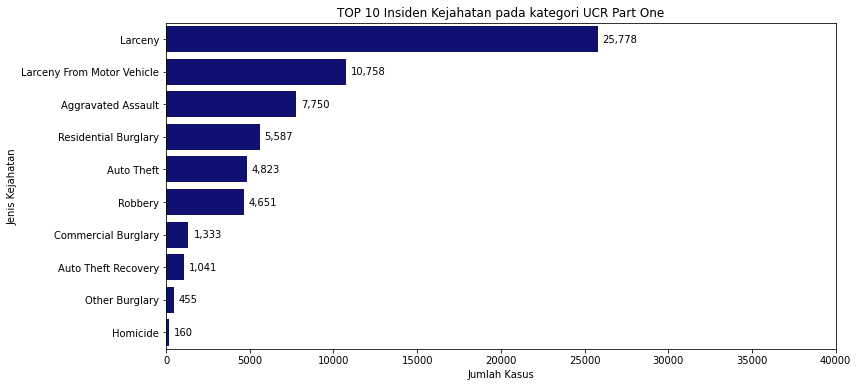

In [119]:
barplot_crime('Part One');

- Dari grafik di atas kita dapat melihat bahwa 3 insiden kejahatan kategori UCR Part One yang paling sering terjadi adalah Larceny, Larceny From Motor Vehicle, dan Aggravated Assault.
- Selain itu kejahatan Larceny juga jumlahnya hampir 2.5 kali lipat dari kejahatan Larceny From Motor Vehicle.
- Kejadian yang paling jarang terjadi pada kategori UCR Part One adalah Homicide.

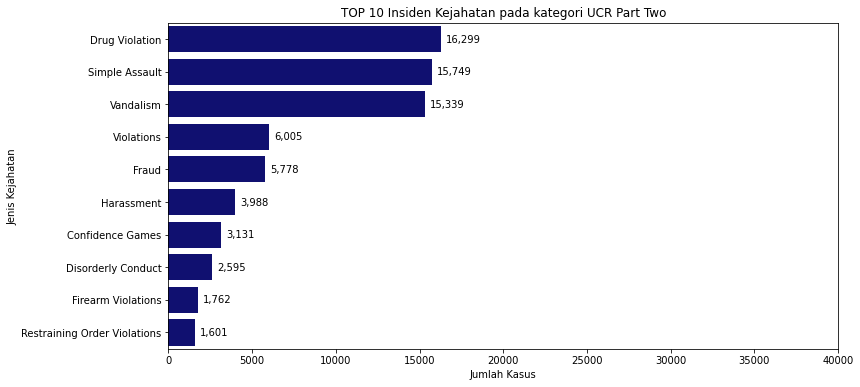

In [120]:
barplot_crime('Part Two');

- Dari grafik di atas kita dapat melihat bahwa 3 insiden kejahatan kategori UCR Part Two yang paling sering terjadi adalah Drug Violation, Simple Assault, dan Vandalism
- Jumlah kasus untuk ketiga jenis kejahatan tersebut masing-masing berkisar antara 15000 - 16500 kasus.

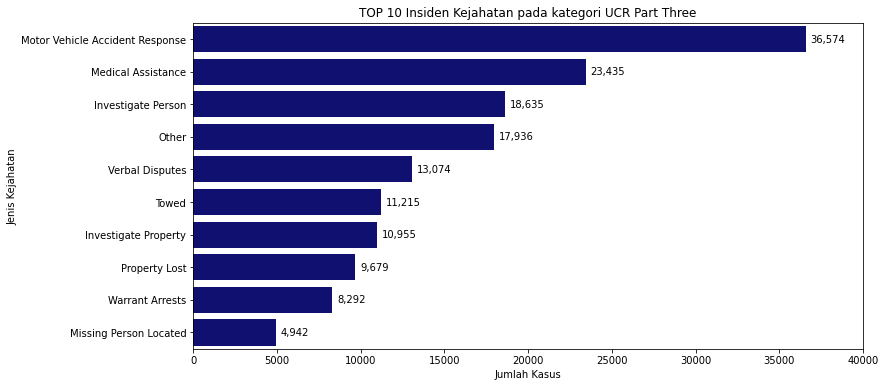

In [121]:
barplot_crime('Part Three');

- Dari grafik di atas kita dapat melihat bahwa 3 insiden kejahatan kategori UCR Part Three yang paling sering terjadi adalah Motor Vehicle Accident Response, Medical Assistance, dan Investigate Person
- Ketiga hal tersebut dapat kita asumsikan sebagai aksi/respon yang dilakukan langsung oleh kepolisian (bukan insiden kejahatan) sehingga insiden yang terjadi kita asumsikan sebagai Motor Vehicle Accident, Insiden yang Membutuhkan Pertolongan Medis, serta Insiden yang Perlu Menyelidiki Orang 
- Kita juga dapat melihat bahwa Motor Vehicle Accident Response dengan jumlah sebanyak 36.574 kasus merupakan jumlah kasus tertinggi tidak hanya pada UCR kategori Part Three, tetapi juga untuk seluruh jenis kejahatan yang terjadi dalam dataset tersebut.

`Kejahatan yang paling sering melibatkan penembakan`

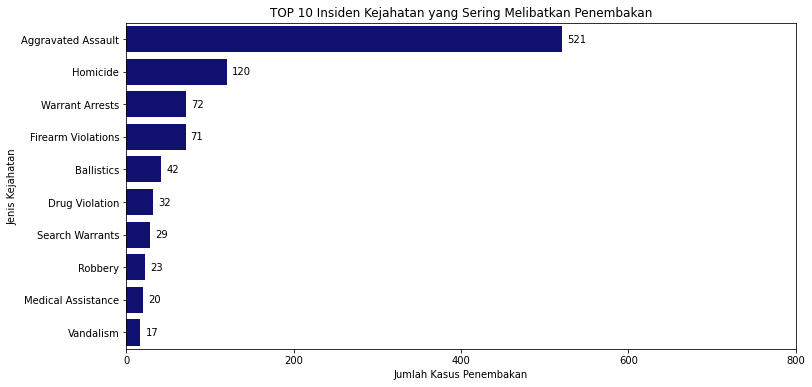

In [122]:
# membuat barplot berdasarkan jenis kejahatan [OFFENSE_CODE_GROUP] dan indikasi penembakan
shooting_table = df_crime[df_crime['SHOOTING']=='Y'][['OFFENSE_CODE_GROUP']].value_counts().reset_index().rename(columns={'OFFENSE_CODE_GROUP' : 'Jenis Kejahatan', 0 : 'Jumlah Kasus Penembakan'})
plt.figure(figsize=(12,6))
ax = sns.barplot(data=shooting_table.head(10), x = 'Jumlah Kasus Penembakan', y ='Jenis Kejahatan', ci=0, order=shooting_table.head(10)['Jenis Kejahatan'], palette=['navy'])
plt.title(f'TOP 10 Insiden Kejahatan yang Sering Melibatkan Penembakan')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 5)
plt.xticks(range(0,801,200))
ax;

- Dari grafik di atas kita dapat melihat bahwa 3 insiden kejahatan yang paling sering melibatkan penembakan adalah Aggravated Assault, Homicide, dan Warrant Arrests.
- Namun jika kita kaji lebih dalam dengan membagi jumlah kasus penembakan dengan jumlah kasus secara keseluruhan untuk tiap-tiap jenis kejahatan seperti terlihat pada tabel di bawah. Maka secara persentase kita dapati justru peringkat pertama diduduki oleh Homicide, peringkat kedua oleh Manslaughter, sedangkan Aggravated Assault yang memiliki jumlah kasus penembakan tertinggi berada di peringkat ketiga.
- Hal ini menunjukkan bahwa kasus pembunuhan memiliki tingkat persentase penembakan yang lebih tinggi.

In [123]:
# membuat tabulasi persentase jumlah kasus penembakan terhadap jumlah kasus keseluruhan berdasarkan jenis kejahatan

kasus_penembakan = shooting_table.merge(df_crime[df_crime['OFFENSE_CODE_GROUP'].isin(shooting_table['Jenis Kejahatan'])]['OFFENSE_CODE_GROUP'].value_counts().reset_index().rename(columns={'index' : 'Jenis Kejahatan', 'OFFENSE_CODE_GROUP' : 'Jumlah Kasus Keseluruhan'}))
kasus_penembakan['Persentase (%)'] = round(kasus_penembakan['Jumlah Kasus Penembakan'] / kasus_penembakan['Jumlah Kasus Keseluruhan'] * 100, 2)
kasus_penembakan.sort_values('Persentase (%)', ascending=False).head(10)

,Jenis Kejahatan,Jumlah Kasus Penembakan,Jumlah Kasus Keseluruhan,Persentase (%)
1,Homicide,120,160,75.00
23,Manslaughter,1,8,12.50
0,Aggravated Assault,521,7750,6.72
4,Ballistics,42,972,4.32
3,Firearm Violations,71,1762,4.03
6,Search Warrants,29,957,3.03
2,Warrant Arrests,72,8292,0.87
7,Robbery,23,4651,0.49
15,Firearm Discovery,3,695,0.43
5,Drug Violation,32,16299,0.20


`Kejahatan yang paling sering muncul bersamaan`

In [124]:
# membuat tabel yang berisi duplikat incident number beserta Ofeense description groupnya
simultant_crime = df_crime[df_crime.duplicated(subset=['INCIDENT_NUMBER'], keep=False)][['INCIDENT_NUMBER','OFFENSE_DESCRIPTION']].sort_values(['INCIDENT_NUMBER','OFFENSE_DESCRIPTION'])

# menambah 1 kolom yang menggabungkan INCIDENT_NUMBER dan 'OFFENSE_DESCRIPTION' dalam bentuk tuple
simultant_crime['number_and_offense'] = list(zip(simultant_crime['INCIDENT_NUMBER'], simultant_crime['OFFENSE_DESCRIPTION']))
simultant_crime

,INCIDENT_NUMBER,OFFENSE_DESCRIPTION,number_and_offense
316340,I030217815,"MURDER, NON-NEGLIGIENT MANSLAUGHTER","(I030217815, MURDER, NON-NEGLIGIENT MANSLAUGHTER)"
316341,I030217815,WARRANT ARREST,"(I030217815, WARRANT ARREST)"
316337,I060168073,DRUGS - POSS CLASS D - INTENT MFR DIST DISP,"(I060168073, DRUGS - POSS CLASS D - INTENT MFR DIST DISP)"
316338,I060168073,WARRANT ARREST,"(I060168073, WARRANT ARREST)"
316336,I080542626,"DRUGS - POSS CLASS B - COCAINE, ETC.","(I080542626, DRUGS - POSS CLASS B - COCAINE, ETC.)"
...,...,...,...
50,I182070873,PROPERTY - ACCIDENTAL DAMAGE,"(I182070873, PROPERTY - ACCIDENTAL DAMAGE)"
46,I182070875,ASSAULT SIMPLE - BATTERY,"(I182070875, ASSAULT SIMPLE - BATTERY)"
47,I182070875,DISORDERLY CONDUCT,"(I182070875, DISORDERLY CONDUCT)"
24,I182070904,ASSAULT SIMPLE - BATTERY,"(I182070904, ASSAULT SIMPLE - BATTERY)"


In [125]:
number_and_offense = list(simultant_crime['number_and_offense'])

# menggabungkan offense code dengan incident number yang sama
from collections import defaultdict

offense_by_incident_number = defaultdict(list)

for incident_number, offense in number_and_offense:
    offense_by_incident_number[incident_number].append(offense)

dict(offense_by_incident_number) 

# mengambil offense codenya saja
offense_description = list(offense_by_incident_number.values())
offense_description

[['MURDER, NON-NEGLIGIENT MANSLAUGHTER', 'WARRANT ARREST'],
 ['DRUGS - POSS CLASS D - INTENT MFR DIST DISP', 'WARRANT ARREST'],
 ['DRUGS - POSS CLASS B - COCAINE, ETC.',
  'DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP',
  'WARRANT ARREST'],
 ['ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'],
 ['ROBBERY - UNARMED - STREET', 'WARRANT ARREST'],
 ['LARCENY OTHER $50 TO $199', 'WARRANT ARREST'],
 ['ASSAULT SIMPLE - BATTERY', 'WARRANT ARREST'],
 ['LARCENY ALL OTHERS', 'WARRANT ARREST'],
 ['ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'],
 ['LARCENY SHOPLIFTING $50 TO $199', 'WARRANT ARREST'],
 ['INVESTIGATE PERSON', 'PROSTITUTION - COMMON NIGHTWALKER', 'WARRANT ARREST'],
 ['TRESPASSING', 'WARRANT ARREST'],
 ['ASSAULT SIMPLE - BATTERY', 'WARRANT ARREST'],
 ['DRUGS - POSS CLASS A - INTENT TO MFR DIST DISP',
  'SEARCH WARRANT',
  'WARRANT ARREST'],
 ['LARCENY ALL OTHERS', 'THREATS TO DO BODILY HARM', 'WARRANT ARREST'],
 ['AUTO THEFT', 'RECOVERED - MV RECOVERED IN BOSTON (STOLEN OUTSIDE BO

In [126]:
# membuat pasangan offense description pada setiap list kejahatan dalam incident number yang sama
import itertools

offense_pair = []

for offense in offense_description :
    for pair in itertools.combinations(offense,2):
        offense_pair.append(pair)

offense_pair

[('MURDER, NON-NEGLIGIENT MANSLAUGHTER', 'WARRANT ARREST'),
 ('DRUGS - POSS CLASS D - INTENT MFR DIST DISP', 'WARRANT ARREST'),
 ('DRUGS - POSS CLASS B - COCAINE, ETC.',
  'DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP'),
 ('DRUGS - POSS CLASS B - COCAINE, ETC.', 'WARRANT ARREST'),
 ('DRUGS - POSS CLASS D - INTENT TO MFR DIST DISP', 'WARRANT ARREST'),
 ('ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'),
 ('ROBBERY - UNARMED - STREET', 'WARRANT ARREST'),
 ('LARCENY OTHER $50 TO $199', 'WARRANT ARREST'),
 ('ASSAULT SIMPLE - BATTERY', 'WARRANT ARREST'),
 ('LARCENY ALL OTHERS', 'WARRANT ARREST'),
 ('ASSAULT & BATTERY D/W - OTHER', 'WARRANT ARREST'),
 ('LARCENY SHOPLIFTING $50 TO $199', 'WARRANT ARREST'),
 ('INVESTIGATE PERSON', 'PROSTITUTION - COMMON NIGHTWALKER'),
 ('INVESTIGATE PERSON', 'WARRANT ARREST'),
 ('PROSTITUTION - COMMON NIGHTWALKER', 'WARRANT ARREST'),
 ('TRESPASSING', 'WARRANT ARREST'),
 ('ASSAULT SIMPLE - BATTERY', 'WARRANT ARREST'),
 ('DRUGS - POSS CLASS A - INTENT TO MFR 

In [127]:
df_offense_pair = pd.Series(offense_pair).value_counts().to_frame().reset_index().rename(columns={'index' : 'Jenis Kejahatan', 0 : 'Jumlah Kasus'})
df_offense_pair

,Jenis Kejahatan,Jumlah Kasus
0,"(MISSING PERSON, MISSING PERSON - LOCATED)",2724
1,"(LARCENY THEFT FROM MV - NON-ACCESSORY, VANDALISM)",749
2,"(LARCENY SHOPLIFTING, WARRANT ARREST)",516
3,"(DRUGS - POSS CLASS B - COCAINE, ETC., WARRANT ARREST)",496
4,"(ASSAULT - AGGRAVATED - BATTERY, ASSAULT SIMPLE - BATTERY)",493
...,...,...
3742,"(INVESTIGATE PROPERTY, LIQUOR - DRINKING IN PUBLIC)",1
3743,"(BURGLARY - COMMERICAL - ATTEMPT, ROBBERY - COMMERCIAL)",1
3744,"(ASSAULT - AGGRAVATED - BATTERY, BURGLARY - COMMERICAL - ATTEMPT)",1
3745,"(ASSAULT - AGGRAVATED, BURGLARY - COMMERICAL - ATTEMPT)",1


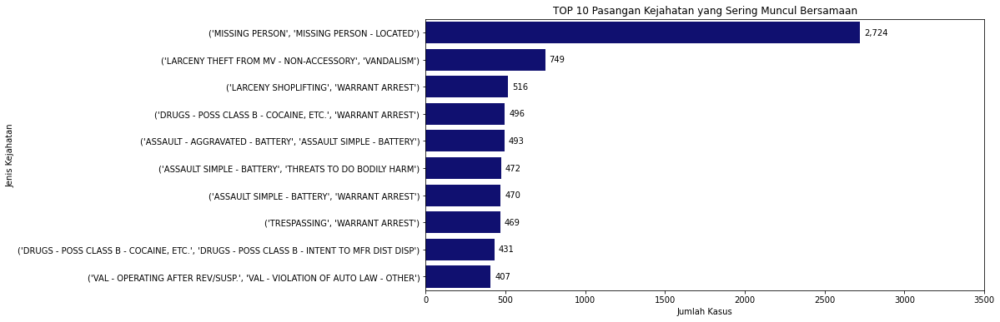

In [128]:
# membuat barplot 
plt.figure(figsize=(12,6))
ax = sns.barplot(data=df_offense_pair.head(10), x = 'Jumlah Kasus', y ='Jenis Kejahatan', ci=0, order=df_offense_pair.head(10)['Jenis Kejahatan'], palette=['navy'])
plt.title(f'TOP 10 Pasangan Kejahatan yang Sering Muncul Bersamaan')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 5)
plt.xticks(range(0,3501,500))
ax;

- Dari grafik di atas kita dapat melihat bahwa TOP 3 pasangan offense_description yang sering terjadi bersamaan yaitu :
    * Missing Person dan Missing Person - Located
    * Larceny Theft From MV - Non Accesory dan Vandalism
    * Larceny Shoplifting dan Warrant Arrest

- Namun, karena 'Missing Person - Located' (penemuan lokasi orang hilang) dan 'Warrant Arrest' (surat perintah penangkapan) dapat kita asumsikan sebagai aksi yang dilakukan langsung oleh kepolisian (bukan insiden kejahatan), maka pasangan kejahatan yang sering terjadi bersamaan yaitu : 
    * Larceny Theft From MV - Non Accesory dan Vandalism
    * Assault-Aggravated-Battery dan Assault Simple-Battery
    * Assault Simple-Battery dan Threats To Do Bodily Harm

### *APAKAH JUMLAH KEJAHATAN BERUBAH DARI HARI KE HARI? BULAN? TAHUN?*

`Jumlah kejahatan tiap tahun`

In [129]:
# membuat countplot
def countplot_crime(time, judul, urutan, labeling=0) :  
    plt.figure(figsize=(12,6))
    ax = sns.countplot(data=df_crime, x=time, color='navy', order=urutan)
    plt.title(f'Jumlah Kejahatan Pada Tiap {judul}')
    plt.xlabel(f'{judul}')
    plt.ylabel('Jumlah Kasus')
    if labeling == 1:
        container = ax.containers[0]
        ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
    return ax

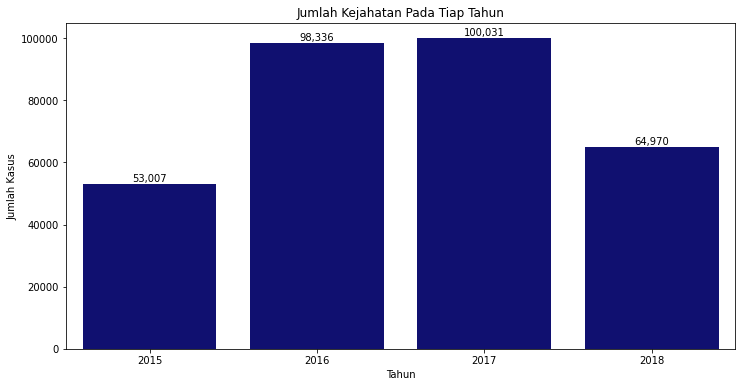

In [130]:
countplot_crime('YEAR', 'Tahun', range(2015,2019), 1);

- Jumlah kasus tertinggi pada dataset terjadi pada tahun 2017.
- Berdasarkan grafik di atas, terjadi peningkatan jumlah kasus sepanjang tahun 2015 - 2017 dan terjadi penurunan pada tahun 2018

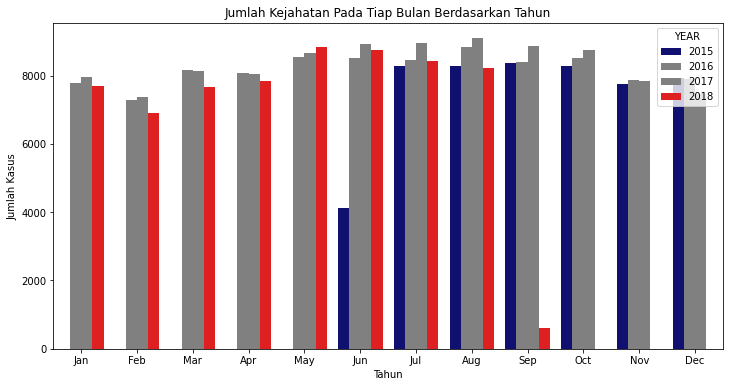

In [131]:
# membuat countplot jumlah kasus pada tiap bulan di hue berdasarkan tahun
plt.figure(figsize=(12,6))
my_palette ={2015: "navy", 2016 : "gray", 2017 : "gray", 2018 : "red"}
ax = sns.countplot(data=df_crime, x='MONTH', hue='YEAR', palette=my_palette)
plt.title(f'Jumlah Kejahatan Pada Tiap Bulan Berdasarkan Tahun')
plt.xlabel('Tahun')
plt.ylabel('Jumlah Kasus')
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.xticks(np.arange(12), months)
ax;

- Namun jika kita perhatikan secara detail, data tahun 2015 hanya ada untuk bulan Juni - Desember, sedangkan data tahun 2018 hanya ada untuk bulan Januari - September. Sehingga tidak akan apple to apple jika kita membandingkan secara langsung dengan tahun 2016 dan 2017.

`Jumlah kejahatan tiap bulan`

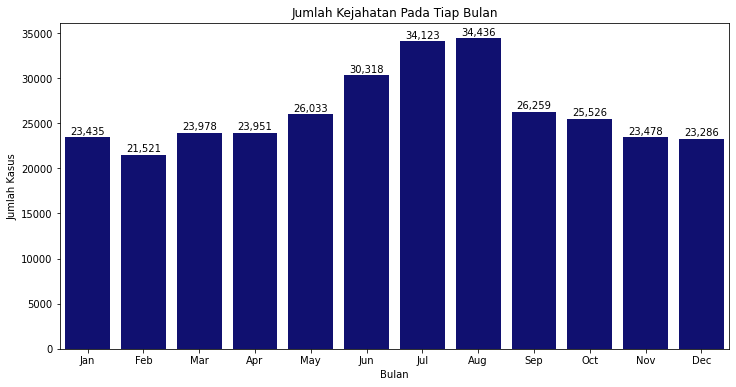

In [132]:
countplot_crime('MONTH', 'Bulan', range(1,13), 1)
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
plt.xticks(np.arange(12), months);

- Berdasarkan grafik di atas, terjadi jumlah kasus tertinggi ada pada bulan Agustus, Juli dan Juni secara berturut-turut.
- Sedangkan jumlah kasus terendah ada pada bulan Februari.
- Namun kita perlu mewaspadai kemungkinan biasnya data karena tidak adanya data bulan Januari - Mei untuk tahun 2015 dan September - Oktober tahun 2018.

In [133]:
# membuat list urutan bulan dan tahun
order_time = list(pd.to_datetime(df_crime['OCCURRED_ON_DATE'].sort_values()).dt.strftime('%b-%y').unique())

# membuat tabel occured on date dalam format Mmm-yy
bulan_tahun = pd.to_datetime(df_crime['OCCURRED_ON_DATE'].sort_values()).dt.strftime('%b-%y').to_frame()
bulan_tahun.head(5)


,OCCURRED_ON_DATE
314781,Jun-15
314782,Jun-15
307747,Jun-15
251189,Jun-15
127689,Jun-15


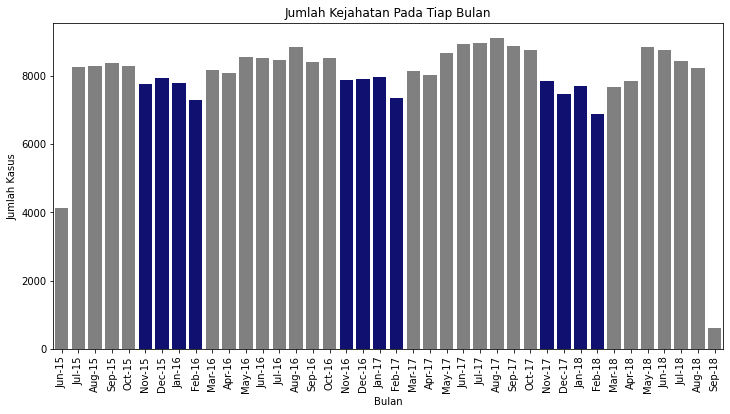

In [134]:
# membuat countplot perbulan secara series
plt.figure(figsize=(12,6))
my_palette = ['gray', 'gray', 'gray', 'gray', 'gray', 'navy', 'navy', 'navy', 'navy', 'gray', 'gray', 'gray',]
ax = sns.countplot(data=bulan_tahun, x='OCCURRED_ON_DATE', order=order_time, palette=my_palette)
plt.title(f'Jumlah Kejahatan Pada Tiap Bulan')
plt.xlabel('Bulan')
plt.ylabel('Jumlah Kasus')
plt.xticks(np.arange(len(order_time)), order_time, rotation=90)
ax;

- Berdasarkan grafik di atas, dengan mengabaikan data pencilan pada Jun-15 dan Sep-18, jumlah kasus terendah pada tiap tahun memang terjadi pada bulan Februari.
- Secara umum jumlah kasus kejahatan cenderung bersifat cyclical dimana jumlah kejahatan relatif meningkat pada bulan Maret-Agustus, kemudian cenderung turun pada bulan September - Februari dimana titik terendahnya terjadi di bulan Februari.
- Jumlah kasus kejahatan pada periode November - Februari pun relatif lebih rendah dibandingkan bulan lainnya dimana berdasarkan domain knowledge pada periode tersebut memang sedang berlangsung musim dingin di Boston (awal Desember - pertengahan Maret)

`Jumlah kejahatan tiap hari`

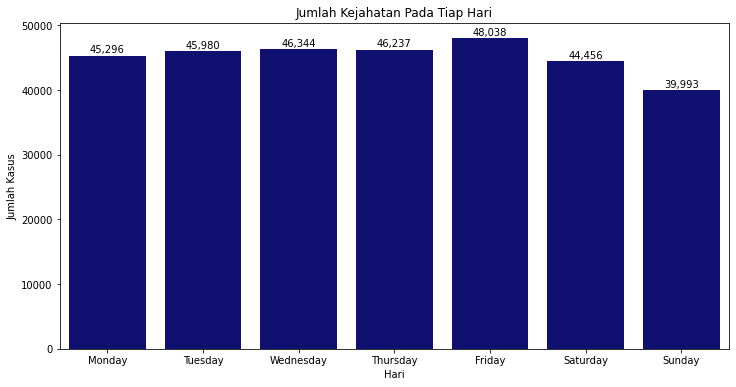

In [135]:
countplot_crime('DAY_OF_WEEK', 'Hari', ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], 1);

- Berdasarkan grafik di atas, jumlah kasus tertinggi terjadi pada hari Jumat sedangkan kasus terendah pada terjadi pada hari Minggu.
- Jika kita perhatikan jumlah kasus terendah setelah Minggu adalah hari Sabtu, dimana keduanya adalah akhir pekan.

In [136]:
# membuat tabel yang berisi tanggal, jumlah kasus, dan satus pekan (Weekday/Weekend)
kasus_harian = df_crime[['OCCURRED_ON_DATE', 'WEEK']].copy()
kasus_harian['OCCURRED_ON_DATE'] = pd.to_datetime(kasus_harian['OCCURRED_ON_DATE'].sort_values()).dt.strftime('%d %b %y')
df_A = kasus_harian.groupby('OCCURRED_ON_DATE').count().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'WEEK' : 'Jumlah Kasus'})
df_B = kasus_harian.groupby('OCCURRED_ON_DATE').max().reset_index().rename(columns={'OCCURRED_ON_DATE' : 'Tanggal', 'WEEK' : 'Pekan'})

kasus_harian = df_A.merge(df_B)
kasus_harian.head()

,Tanggal,Jumlah Kasus,Pekan
0,01 Apr 16,352,Weekday
1,01 Apr 17,296,Weekend
2,01 Apr 18,241,Weekend
3,01 Aug 15,274,Weekend
4,01 Aug 16,320,Weekday


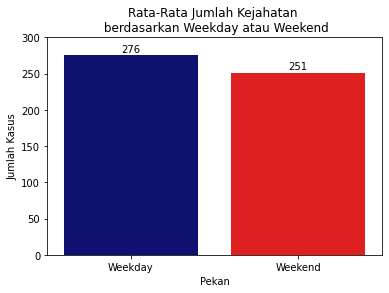

In [137]:
ax = sns.barplot(data=kasus_harian, x='Pekan', y = 'Jumlah Kasus', ci=0, palette=['navy', 'red'])
plt.title(f'Rata-Rata Jumlah Kejahatan \n berdasarkan Weekday atau Weekend')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
plt.yticks(range(0,301,50))
ax;

- Kita dapat melihat bahwa rata-rata jumlah kasus pada Weekday adalah 276 kasus/hari dan pada Weekend adalah 251 kasus/hari.

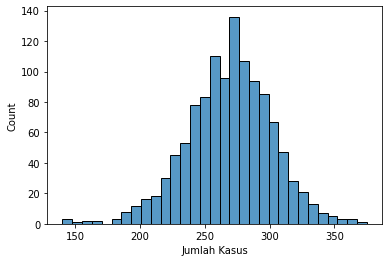

In [138]:
# membuat histogram
sns.histplot(data=kasus_harian, x='Jumlah Kasus');

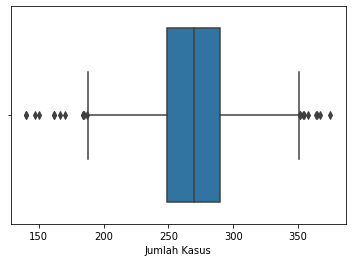

In [139]:
# membuat boxplot
sns.boxplot(data=kasus_harian, x='Jumlah Kasus');

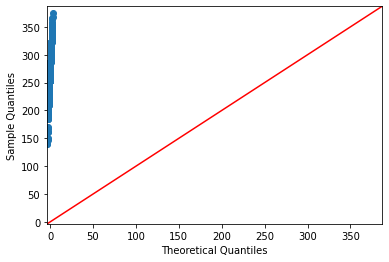

In [140]:
# membuat qqplot
import statsmodels.api as sm
sm.qqplot(data=kasus_harian['Jumlah Kasus'], line = '45');

In [141]:
# uji normalitas Shapiro Wilk
from scipy.stats import shapiro

stat, pvalue = shapiro(kasus_harian['Jumlah Kasus'])

pvalue

if pvalue > 0.05 :
    print(f'pvalue={pvalue}, kita mengasumsikan data terdistribusi normal')
else :
    print(f'pvalue={pvalue}, kita mengasumsikan data TIDAK terdistribusi normal')

pvalue=5.288335887598805e-05, kita mengasumsikan data TIDAK terdistribusi normal


In [142]:
# uji normalitas D'Agostino Pearson
from scipy.stats import normaltest

stat, pvalue = normaltest(kasus_harian['Jumlah Kasus'])

pvalue

if pvalue > 0.05 :
    print(f'pvalue={pvalue}, kita mengasumsikan data terdistribusi normal')
else :
    print(f'pvalue={pvalue}, kita mengasumsikan data TIDAK terdistribusi normal')

pvalue=2.4506630498709894e-06, kita mengasumsikan data TIDAK terdistribusi normal


- Berdasarkan histogram dan boxplot, jumlah kasus kita asumsikan TIDAK terdistribusi normal karena distribusinya cenderung left skewed
- Berdasarkan QQplot, data kita asumsikan TIDAK terdistribusi normal karena titik biru tidak mengikuti garis merah
- Berdasarkan uji normalitas menggunakan Shapiro Wilk Test dan D'Agostino & Pearson Test didapati bahwa jumlah kasus perhari kita asumsikan TIDAK terdistribusi normal
- Oleh karena itu selanjutnya, kita akan coba menguji apakah ada perbedaan median jumlah kasus yang terjadi pada Weekday dan Weekend atau tidak.

- Hypothesis
    * Ho: Median jumlah kasus pada 'Weekday' = Median jumlah kasus pada 'Weekend'
    * Ha: Median jumlah kasus pada 'Weekday' != Median jumlah kasus pada 'Weekend'

- Mengingat data kita asumsikan TIDAK terdistribusi normal dan kedua popalasi yang dibandingkan tidak berpasangan (unpaired), maka kita akan menguji hipotesis menggunakan Mann Whitney Test

In [143]:
# uji hipotesis

from scipy.stats import mannwhitneyu

stat, pvalue = mannwhitneyu(
    kasus_harian[kasus_harian['Pekan']=='Weekday']['Jumlah Kasus'],
    kasus_harian[kasus_harian['Pekan']=='Weekend']['Jumlah Kasus']
)

# conclusion

if pvalue > 0.05:
    print(f'''
    pvalue = {pvalue}. pvalue > 0.05. Fail to reject Ho. 
    Kita TIDAK punya cukup bukti bahwa median jumlah kasus pada 'Weekday'
    TIDAK SAMA DENGAN median jumlah kasus pada 'Weekend'.
    ''')
else:
    print(f'''
    pvalue = {pvalue}. pvalue <= 0.05. Reject Ho. 
    Kita punya cukup bukti bahwa median jumlah kasus pada 'Weekday'
    TIDAK SAMA DENGAN median jumlah kasus pada 'Weekend'.
    ''')


    pvalue = 2.0814453904190852e-33. pvalue <= 0.05. Reject Ho. 
    Kita punya cukup bukti bahwa median jumlah kasus pada 'Weekday'
    TIDAK SAMA DENGAN median jumlah kasus pada 'Weekend'.
    


- Kita punya cukup bukti bahwa median jumlah kasus pada 'Weekday' TIDAK SAMA DENGAN median jumlah kasus pada 'Weekend'.

`Jumlah kejahatan tiap jam`

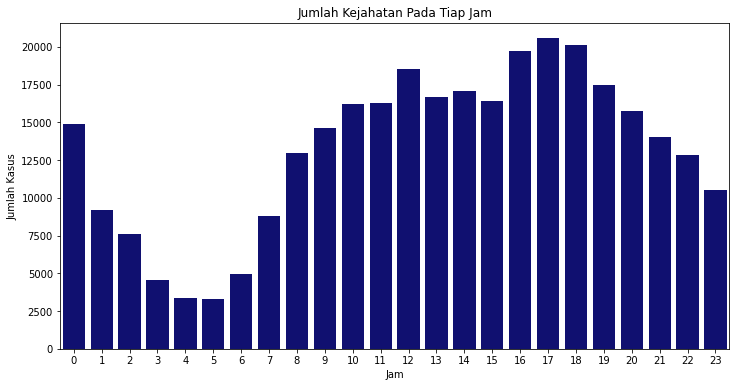

In [144]:
countplot_crime('HOUR', 'Jam', range(0,24));

- Berdasarkan grafik di atas, jumlah kasus tertinggi terjadi pada pukul 16:00 - 18:59 dan yang terendah pada pukul 4:00 - 5:59
- Dari grafik juga dapat kita asumsikan bahwa jumlah kasus kejahatan cenderung bersifat siklikal dimana insiden kejahatan cenderung terjadi dan naik dari pukul 5:00 - 17:59 kemudian berangsur turun pada pukul 18:00 - 4:59
- Insiden kejahatan juga nampak tinggi pada pukul 12:00-12:59

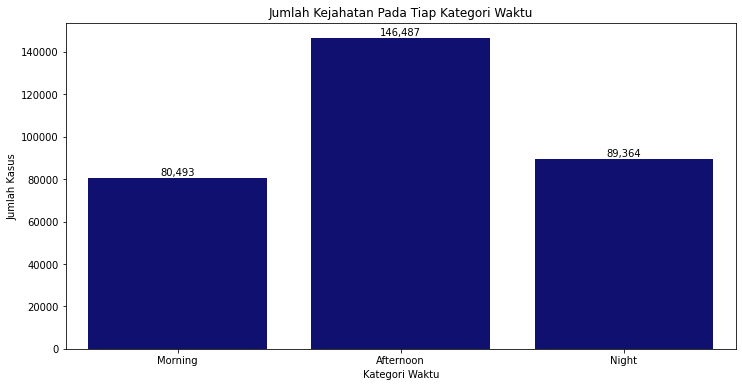

In [145]:
countplot_crime('TIME', 'Kategori Waktu', ['Morning', 'Afternoon', 'Night'], 1);

- Insiden kejahatan banyak terjadi pada Afternoon (12:00 - 19:59) dengan jumlah hampir 2 kali kejadian baik pada Morning (4:00 - 11:59) maupun Night (20:00 - 3:59) 

`Periode terjadinya jenis kejahatan utama`

In [146]:
# membuat tabel berisi OFFENSE_CODE_GROUP (TOP 3 pada masing-masing UCR), WEEK (Weekend/Weekday), dan INCIDENT_NUMBER (Jumlah kasus)
top = ['Larceny', 'Larceny From Motor Vehicle', 'Aggravated Assault', 'Drug Violation', 'Simple Assault', 'Vandalism', 'Motor Vehicle Accident Response', 'Medical Assistance', 'Investigate Person']
df_top = df_crime[df_crime['OFFENSE_CODE_GROUP'].isin(top)]
df_top_by_week = df_top.groupby(['OFFENSE_CODE_GROUP', 'WEEK']).count()['INCIDENT_NUMBER'].to_frame().reset_index()
df_top_by_week.head()

,OFFENSE_CODE_GROUP,WEEK,INCIDENT_NUMBER
0,Aggravated Assault,Weekday,5210
1,Aggravated Assault,Weekend,2540
2,Drug Violation,Weekday,13263
3,Drug Violation,Weekend,3036
4,Investigate Person,Weekday,13881


In [147]:
# menghitung banyaknya hari pada kategori weekend dan weekday
banyak_hari = kasus_harian[['Pekan']].value_counts()
banyak_hari

Pekan  
Weekday    841
Weekend    336
dtype: int64

In [148]:
#  menambah kolom banyak hari dan rata-rata kasus
df_top_by_week['BANYAK HARI'] = df_top_by_week['WEEK'].apply(lambda x : banyak_hari[0] if x == 'Weekday' else banyak_hari[1] )
df_top_by_week['RATA RATA KASUS'] = round(df_top_by_week['INCIDENT_NUMBER']/df_top_by_week['BANYAK HARI'], 1)
df_top_by_week.head()

,OFFENSE_CODE_GROUP,WEEK,INCIDENT_NUMBER,BANYAK HARI,RATA RATA KASUS
0,Aggravated Assault,Weekday,5210,841,6.2
1,Aggravated Assault,Weekend,2540,336,7.6
2,Drug Violation,Weekday,13263,841,15.8
3,Drug Violation,Weekend,3036,336,9.0
4,Investigate Person,Weekday,13881,841,16.5


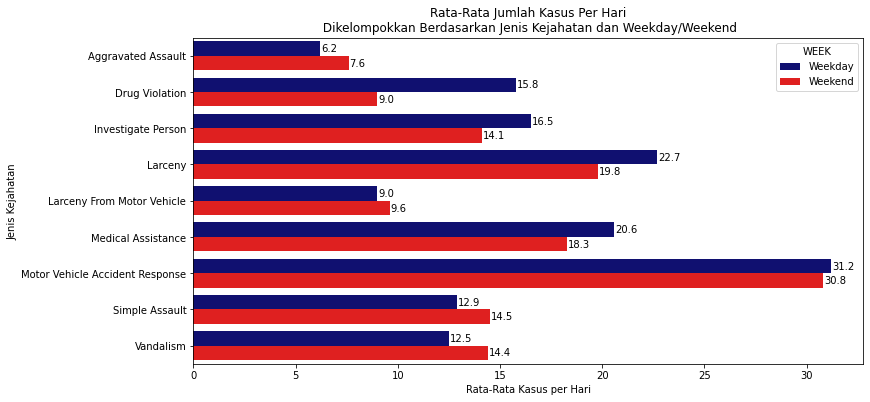

In [149]:
# membuat barplot
plt.figure(figsize=(12,6))
ax = sns.barplot(data=df_top_by_week, y='OFFENSE_CODE_GROUP', x = 'RATA RATA KASUS', hue='WEEK', ci=0, palette=['navy', 'red'])
plt.title(f'Rata-Rata Jumlah Kasus Per Hari\n Dikelompokkan Berdasarkan Jenis Kejahatan dan Weekday/Weekend')
plt.xlabel('Rata-Rata Kasus per Hari')
plt.ylabel('Jenis Kejahatan')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.1f}' for x in container.datavalues], label_type='edge', padding = 1)
container = ax.containers[1]
ax.bar_label(container , labels=[f'{x:,.1f}' for x in container.datavalues], label_type='edge', padding = 1)
ax;

- Aggravated Assault, Larceny From Motor Vehicle, Simple Assaul dan Vandalism lebih sering terjadi di Weekend (Akhir Pekan)
- Drug Violation, Larceny, Investigate Person, Medical Assistance, dan Motor Vehicle Accident Response lebih sering terjadi di Weekday (Hari Kerja)

### *DIMANA BERBAGAI JENIS KEJAHATAN PALING MUNGKIN TERJADI?*

`Jumlah kejahatan pada tiap distrik`

In [150]:
# membuat list yang berisi nama distrik diurutkan berdasarkan jumlah kasusnya
urutan_distrik = list(df_crime['DISTRICT'].value_counts().reset_index()['index'])

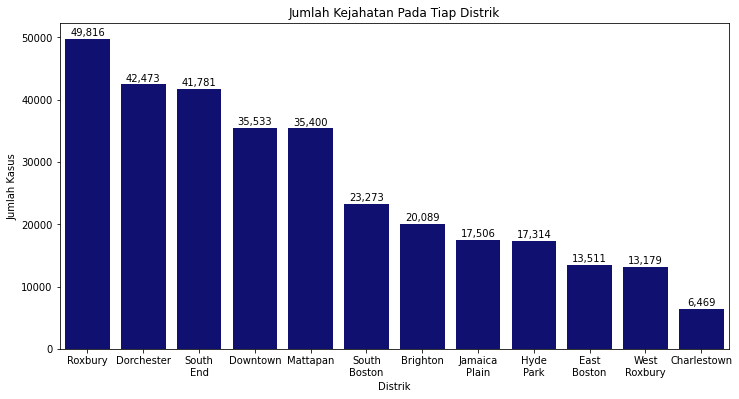

In [151]:
countplot_crime('DISTRICT', 'Distrik', urutan_distrik, 1);
distrik = ['Roxbury','Dorchester','South\nEnd','Downtown','Mattapan','South\nBoston',
 'Brighton','Jamaica\nPlain','Hyde\nPark','East\nBoston','West\nRoxbury','Charlestown']
plt.xticks(np.arange(12), distrik);

- Kita dapat melihat bahwa jumlah kejahatan tertinggi terjadi di Distrik Roxbury, diikuti distrik Dorchester dan South End.
- Distrik dengan jumlah kejahatan terendah terjadi di Charlestown.

In [152]:
# menampilkan banyaknya area yang unik di tiap district
df_C = df_crime.groupby('DISTRICT').nunique()[['REPORTING_AREA']].reset_index().rename(columns={'DISTRICT':'Distrik','REPORTING_AREA':'Jumlah Area'})

# menampilkan banyaknya jumlah kasus di tiap district
df_D = df_crime['DISTRICT'].value_counts().to_frame().reset_index().rename(columns={'index' : 'Distrik','DISTRICT':'Jumlah Kasus'})

# membuat tabel berisi Nama Distrik, Jumlah Area dan Jumlah Kasus di Tiap District
tabel_distrik = df_C.merge(df_D)
tabel_distrik

,Distrik,Jumlah Area,Jumlah Kasus
0,Brighton,94,20089
1,Charlestown,40,6469
2,Dorchester,168,42473
3,Downtown,128,35533
4,East Boston,46,13511
5,Hyde Park,103,17314
6,Jamaica Plain,103,17506
7,Mattapan,120,35400
8,Roxbury,179,49816
9,South Boston,86,23273


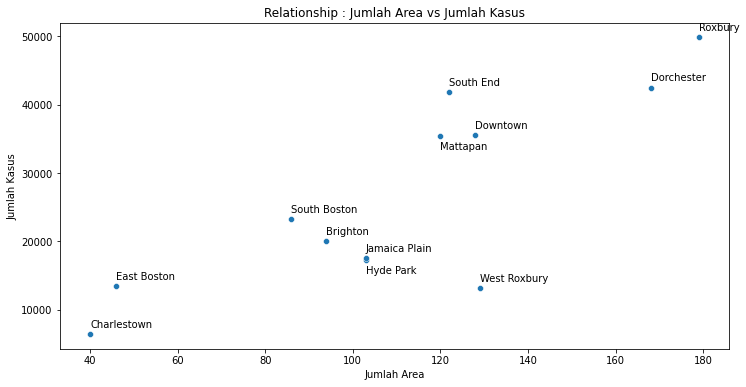

In [153]:
# membuat scatterplot
plt.figure(figsize=(12,6))
sns.scatterplot(data=tabel_distrik, x='Jumlah Area', y='Jumlah Kasus');
plt.title('Relationship : Jumlah Area vs Jumlah Kasus')
geser = [1000, 1000, 1000, 1000, 1000, -2000, 1000, -2000, 1000, 1000, 1000, 1000]
for i, txt in enumerate(tabel_distrik['Distrik']):
    plt.annotate(txt, (tabel_distrik['Jumlah Area'][i], tabel_distrik['Jumlah Kasus'][i]+ geser[i]))

In [154]:
# menghitung nilai korelasi dengan metode spearman (data berjumlah kecil, yakni kurang dari 30 data atau observasi)
tabel_distrik[['Jumlah Area', 'Jumlah Kasus']].corr(method='spearman')

,Jumlah Area,Jumlah Kasus
Jumlah Area,1.000000,0.676008
Jumlah Kasus,0.676008,1.000000


- Dari grafik di atas kita melihat bahwa Roxbury sebagai District yang memiliki jumlah kasus tertinggi, memiliki jumlah area yang tinggi pula.
- Sedangkan Charlestown sebagai District dengan jumlah kasus terendah, memiliki jumlah area yang sedikit pula.
- District West Roxbury dapat dianggap sebagai outlier dimana jumlah area banyak, namun jumlah kasus cukup rendah.
- Dengan menggunakan uji korelasi Spearman didapat nilai r = 0.676
- Hal ini menunjukan ada hubungan positif antara variable jumlah area dengan jumlah kasus
- Hubungan positif dimana jika jumlah area naik, maka variable jumlah kasus juga ikut naik
- Nilai r = 0.67 juga menunjukkan bahwa jumlah area dan jumlah kasus memiliki hubungan yang kuat

`Distrik dengan kemungkinan terjadinya kasus penembakan`

In [155]:
# membuat tabel berisi nama-nama district yang terjadi kasus penembakan
shooting = df_crime[df_crime['SHOOTING']=='Y'][['DISTRICT']]

# membuat tabel nama district dan jumlahkasus penembakan
shooting_by_district = shooting.value_counts().reset_index().rename(columns={'DISTRICT':'Distrik',0 :'Jumlah Kasus Penembakan'})

# membuat list nama-nama distrik yang diurutkan berdasarkan jumlah kasus penembakan
urutan_distrik = list(shooting_by_district['Distrik'])


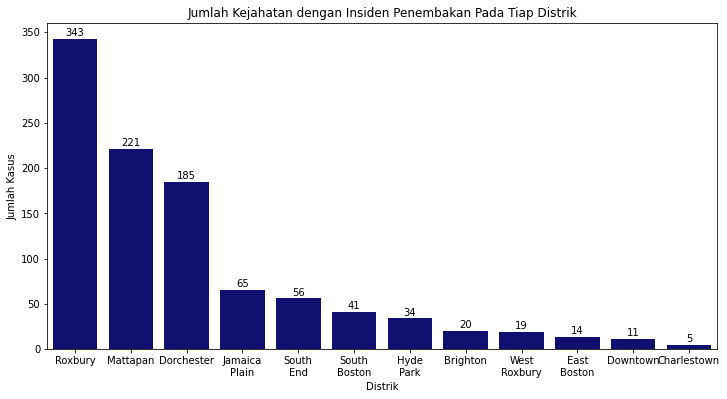

In [156]:
# membuat countplot
plt.figure(figsize=(12,6))
ax = sns.countplot(data=shooting, x='DISTRICT', color='navy', order=urutan_distrik)
plt.title(f'Jumlah Kejahatan dengan Insiden Penembakan Pada Tiap Distrik')
plt.xlabel(f'Distrik')
plt.ylabel('Jumlah Kasus')
container = ax.containers[0]
ax.bar_label(container , labels=[f'{x:,.0f}' for x in container.datavalues], label_type='edge', padding = 1)
distrik = ['Roxbury','Mattapan','Dorchester','Jamaica\nPlain','South\nEnd','South\nBoston','Hyde\nPark',
 'Brighton','West\nRoxbury','East\nBoston','Downtown','Charlestown']
plt.xticks(np.arange(12), distrik);
ax;

- Jumlah kasus kejahatan dengan penembakan paling tinggi terjadi di District Roxburry, Mattapan, dan Dorchester secara berturut turut.
- Jumlah terendah terjadi di area Charlestown.

In [157]:
# membuat tabel distrik yang berisi persentase kasus penembakan di tiap distrik
tabel_distrik = tabel_distrik.merge(shooting_by_district)
tabel_distrik['Persentase %'] = round((tabel_distrik['Jumlah Kasus Penembakan'] / tabel_distrik['Jumlah Kasus']) * 100 , 2)
tabel_distrik.sort_values('Persentase %', ascending=False)

,Distrik,Jumlah Area,Jumlah Kasus,Jumlah Kasus Penembakan,Persentase %
8,Roxbury,179,49816,343,0.69
7,Mattapan,120,35400,221,0.62
2,Dorchester,168,42473,185,0.44
6,Jamaica Plain,103,17506,65,0.37
5,Hyde Park,103,17314,34,0.20
9,South Boston,86,23273,41,0.18
11,West Roxbury,129,13179,19,0.14
10,South End,122,41781,56,0.13
0,Brighton,94,20089,20,0.10
4,East Boston,46,13511,14,0.10


- Secara persentase, rate insiden penembakan tertinggi tetap diduduki oleh District Roxburry, Mattapan, dan Dorchester secara berturut turut.
- Dimana di Roxbury sendiri rata-rata terjadi 69 insiden penembakan per 10.000 kasus.
- District dengan rate penembakan terendah terjadi di kota Downtown dimana hanya terjadi 3 insiden penembakan per 10.000 kasus.


`Tempat terjadinya jenis kejahatan utama`

In [158]:
# membuat tabulasi Jumlah kejahatan berdasrkan OFFENSE_CODE_GROUP dan DISTRICT
df_top_by_district = df_top.groupby(['OFFENSE_CODE_GROUP', 'DISTRICT']).count()['INCIDENT_NUMBER'].to_frame().reset_index()
df_top_by_district.head()

,OFFENSE_CODE_GROUP,DISTRICT,INCIDENT_NUMBER
0,Aggravated Assault,Brighton,310
1,Aggravated Assault,Charlestown,130
2,Aggravated Assault,Dorchester,1032
3,Aggravated Assault,Downtown,961
4,Aggravated Assault,East Boston,332


In [159]:
# membuat tabulasi jumlah kasus tertinggi untuk tiap jenis kejahatan
df_max = df_top_by_district.groupby(['OFFENSE_CODE_GROUP']).max().reset_index().drop(columns='DISTRICT')
df_max

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER
0,Aggravated Assault,1640
1,Drug Violation,2261
2,Investigate Person,2738
3,Larceny,7306
4,Larceny From Motor Vehicle,2015
5,Medical Assistance,3351
6,Motor Vehicle Accident Response,6388
7,Simple Assault,2508
8,Vandalism,2434


In [160]:
df_max.merge(df_top_by_district, on=['OFFENSE_CODE_GROUP', 'INCIDENT_NUMBER'])

,OFFENSE_CODE_GROUP,INCIDENT_NUMBER,DISTRICT
0,Aggravated Assault,1640,Roxbury
1,Drug Violation,2261,Roxbury
2,Investigate Person,2738,Roxbury
3,Larceny,7306,South End
4,Larceny From Motor Vehicle,2015,South End
5,Medical Assistance,3351,Roxbury
6,Motor Vehicle Accident Response,6388,Roxbury
7,Simple Assault,2508,Roxbury
8,Vandalism,2434,Roxbury


- Dari table summary di atas kita dapat melihat bahwa jumlah kasus tertinggi untuk jenis kejahatan yang utama seperti 'Aggravated Assault', 'Drug Violation', 'Simple Assault', 'Vandalism', 'Motor Vehicle Accident Response', 'Medical Assistance', dan 'Investigate Person' terjadi di distrik Roxbury.
- Sedangkan jumlah kasus tertinggi untuk jenis kejahatan 'Larceny' dan 'Larceny From Motor Vehicle' terjadi di distrik South End.

`Peta Persebaran Kejahatan`

Berdasarkan informasi dari [Wikipedia](https://en.wikipedia.org/wiki/Boston#:~:text=The%20geographical%20center%20of%20Boston,Boston%20is%20the%20North%20End.), pusat geografis kota Boston terletak di District Roxbury.\
Oleh karenanya untuk pembuatan peta folium, kita menggunakan koordinat [Roxbury](https://www.distancesto.com/coordinates/us/roxbury-latitude-longitude/history/202895.html).

In [161]:
# membuat peta boston dengan pusat data di Roxbury
import folium
from folium.plugins import HeatMap

boston_map = folium.Map(
    location=(42.315198, -71.091375),
    zoom_start=12, min_zoom=12,
)

# membuat heatmap untuk seluruh insiden kejahatan
heat_df = df_crime[['Lat', 'Long']]
heat_df = [[row['Lat'],row['Long']] for index, row in heat_df.iterrows()]

## buat marker district

distrik = ['Roxbury','Mattapan','Dorchester','Jamaica Plain','South End','South Boston','Hyde Park','Brighton','West Roxbury','East Boston','Downtown','Charlestown']
lat_boston = [42.315198, 42.277142, 42.30163, 42.3097365, 42.338811, 42.3381437, 42.256529, 42.34635, 42.279755, 42.370214, 42.355709, 42.3782065]
long_boston = [-71.091375, -71.091375, -71.067605, -71.1151431, -71.076519, -71.0475773, -71.124056, -71.162676, -71.162676, -71.03886, -71.057205,-71.0602131]
warna = ['red', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue']
for i in range(len(distrik)) :
    district_boston = folium.Marker(
        location=(lat_boston[i], long_boston[i]),
        popup= folium.Popup(f"<b>{distrik[i]}</b>", max_width=300),
        tooltip= f"{distrik[i]}",
        icon = folium.Icon(color=warna[i], icon='home')
        )
    boston_map.add_child(district_boston)

HeatMap(heat_df,
        gradient={0.1: 'blue', 0.3: 'lime', 0.5: 'yellow', 0.7: 'orange', 1: 'red'}, 
        min_opacity=0.05, 
        max_opacity=0.9, radius=22).add_to(boston_map)

boston_map

- Berdasarkan grafik di atas, kita dapat melihat bahwa Roxbury (ditandai merah) sebagai distrik dengan jumlah kasus kejahatan tertinggi terletak tepat di tengah kota Boston.
- Distrik dengan jumlah insiden kejahatan tertinggi setelah Roxbury yaitu Dorchester dan South End berbatasan langsung dengan Roxbury, dimana Dorchester terletak di sebalah Timur Roxbury, sedangkan South End terletak di sebelah Utara Roxbury.
- Kejahatan tertinggi selanjutnya terletak di sebelah Utara distrik South End yaitu Downstown dan di sebelah Selatan distrik Dorchester yaitu Mattapan.

In [162]:
# membuat peta boston dengan pusat data di Roxbury
import folium
from folium.plugins import HeatMap

boston_map = folium.Map(
    location=(42.315198, -71.091375),
    zoom_start=12, min_zoom=12,
)

# membuat heatmap untuk seluruh insiden kejahatan
heat_df = df_crime[df_crime['SHOOTING']=='Y'][['Lat', 'Long']]
heat_df = [[row['Lat'],row['Long']] for index, row in heat_df.iterrows()]

## buat marker district

distrik = ['Roxbury','Mattapan','Dorchester','Jamaica Plain','South End','South Boston','Hyde Park','Brighton','West Roxbury','East Boston','Downtown','Charlestown']
lat_boston = [42.315198, 42.277142, 42.30163, 42.3097365, 42.338811, 42.3381437, 42.256529, 42.34635, 42.279755, 42.370214, 42.355709, 42.3782065]
long_boston = [-71.091375, -71.091375, -71.067605, -71.1151431, -71.076519, -71.0475773, -71.124056, -71.162676, -71.162676, -71.03886, -71.057205,-71.0602131]
warna = ['red', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue', 'blue']
for i in range(len(distrik)) :
    district_boston = folium.Marker(
        location=(lat_boston[i], long_boston[i]),
        popup= folium.Popup(f"<b>{distrik[i]}</b>", max_width=300),
        tooltip= f"{distrik[i]}",
        icon = folium.Icon(color=warna[i], icon='home')
        )
    boston_map.add_child(district_boston)

HeatMap(heat_df,
        gradient={0.1: 'blue', 0.3: 'lime', 0.5: 'yellow', 0.7: 'orange', 1: 'red'}, 
        min_opacity=0.05, 
        max_opacity=0.9, radius=20).add_to(boston_map)

boston_map

- Adapun insiden kejahatan yang terkait dengan penembakan terkonsentrasi di sekitar Roxbury. 
- District dengan kasus penembakan tertinggi setelah Roxbury, yaitu Mattapan, Dorchester, Jamaica Plain, dan South End relatif berdekatan dan berbatasan langsung dengan Roxbury

# **CONCLUSION AND RECOMMENDATION**

**Kesimpulan**

Dari analisis yang telah dilakukan, kita bisa membuat kesimpulan dan menjawab pertanyaan seputar insiden kriminal yang terjadi di Boston untuk periode Juni 2015 - September 2018 sebagai berikut :
- `Jenis kejahatan apa yang paling umum?`
    * Motor Vehicle Accident Response dengan jumlah sebanyak 36.574 kasus merupakan jumlah kasus tertinggi dari data insiden kejahatan yang disediakan oleh Departemen Kepolisian Boston (BPD). Hal ini menunjukkan insiden kecelakaan lalu lintas merupakan jenis insiden yang paling sering terjadi.
    * Insiden kejahatan dengan kategori Part One (violent & property crime) yang paling sering terjadi adalah Larceny, Larceny From Motor Vehicle, dan Aggravated Assault. Sedangkan yang paling jarang terjadi adalah Homicide. 
    * Insiden kejahatan dengan kategori Part Two yang paling sering terjadi adalah Drug Violation, Simple Assault, dan Vandalism dengan jumlah kejahatan yang relatif seragam di kisaran 15000 - 16500 kasus.
    * Insiden lainnya (Part Three) yang paling sering terjadi adalah Motor Vehicle Accident Response, Medical Assistance, dan Investigate Person yang lebih menunjukkan aksi/respon yang dilakukan langsung oleh kepolisian. Sehingga kita dapat mengethaui bahwa upaya yang paling sering dilakukan oleh kepolisian Boston banyak berupa penanganan kecelakaan lalu lintas, pemberian bantuan medis, dan penyelidikan orang.
    * 75% kasus Homicide atau pembunuhan yang terjadi disertai oleh aksi penembakan.
    * Insiden kejahatan yang banyak terjadi secara bersamaan diantaranya yaitu : 
        * Larceny Theft From MV - Non Accesory dan Vandalism --> ada kemungkinan kegiatan perusakan/vandalisme diiringi dengan aksi pencurian atau sebaliknya
        * Assault-Aggravated-Battery dan Assault Simple-Battery --> ada kemungkinan kegiatan penyerangan yang bersifat ringan diikuti oleh penyerangan yang bersifat berat atau sebaliknya.
        * Assault Simple-Battery dan Threats To Do Bodily Harm --> ada kemungkinan ancaman untuk melakukan kekerasan diikuti oleh penyerangan yang bersifat ringan atau sebaliknya.

<br>

- `Apakah jumlah kejahatan berubah dari hari ke hari? Bulan? Tahun?`
    * Jumlah kasus tertinggi pada dataset terjadi pada tahun 2017 dan terdapat peningkatan dibandingkan kejadian pada tahun 2016. Namun kita tidak dapat membandingkan jumlah kasus pada tahun 2015 dan 2018 dikarenakan data untuk tahun 2015 hanya ada periode bulan Juni - Desember, sedangkan data tahun 2018 hanya ada periode bulan Januari - September.
    * Secara umum jumlah kasus kejahatan cenderung bersifat cyclical dimana jumlah kejahatan relatif meningkat pada bulan Maret-Agustus, kemudian cenderung turun pada bulan September - Februari dimana titik terendahnya terjadi di bulan Februari.
    * Jumlah kasus tertinggi cenderung terjadi pada bulan Juni - Agustus (periode musim panas) sedangkan jumlah kejahatan cenderung rendah pada bulan Desember (periode musim dingin)
    * Rata-rata jumlah kasus pada Weekday adalah 276 kasus/hari sedangkan pada Weekend adalah 251 kasus/hari.
    * Berdasarkan uji hipotesis, kita memiliki cukup bukti bahwa median jumlah kasus pada 'Weekday' TIDAK SAMA DENGAN median jumlah kasus pada 'Weekend'.
    * Jumlah kasus tertinggi terjadi pada hari Jumat sedangkan kasus terendah terjadi pada hari Minggu.
    * Secara harian kasus kejahatan cenderung bersifat siklikal dimana insiden kejahatan cenderung naik dari pukul 5:00 - 17:59 kemudian berangsur turun pada pukul 18:00 - 4:59.
    * Jumlah kasus tertinggi cenderung terjadi pada pukul 12:00 - 12:59 dan 16:00 - 18:59 sedangkan yang terendah pada pukul 4:00 - 5:59
    * Insiden kejahatan banyak terjadi pada Afternoon (12:00 - 19:59) dengan jumlah hampir 2 kali kejadian baik pada Morning (4:00 - 11:59) maupun Night (20:00 - 3:59)
    * Aggravated Assault, Larceny From Motor Vehicle, Simple Assaul dan Vandalism lebih sering terjadi di Weekend (Akhir Pekan)
    * Drug Violation, Larceny, Investigate Person, Medical Assistance, dan Motor Vehicle Accident Response lebih sering terjadi di Weekday (Hari Kerja)

<br>

- `Di mana berbagai jenis kejahatan paling mungkin terjadi?`
    * Jumlah kasus tertinggi terjadi di Distrik Roxbury, Dorchester dan South End. Dimana ketiga area ini saling berdekatan dengan Roxbury sebagai pusatnya (Dorchester terletak di sebelah Timur Roxbury, sedangkan South End terletak di sebelah Utara Roxbury.)
    * Kejahatan tertinggi selanjutnya terletak di sebelah Utara distrik South End yaitu Downstown dan di sebelah Selatan distrik Dorchester yaitu Mattapan
    * Sedangkan Distrik dengan jumlah kejahatan terendah adalah Charlestown.
    * Berdasarkan uji korelasi spearman, didapati hubungan positif antara variable jumlah area dengan jumlah kasus dimana jika jumlah area semakin banyak, maka jumlah kasus juga semakin tinggi. Nilai r = 0.67 juga menunjukkan bahwa jumlah area dan jumlah kasus memiliki hubungan yang kuat.
    * Roxbury sebagai District yang memiliki jumlah kasus tertinggi, memiliki jumlah area yang tinggi pula. Sedangkan Charlestown sebagai District dengan jumlah kasus terendah, memiliki jumlah area yang sedikit pula.
    * District West Roxbury dapat dianggap sebagai outlier dimana jumlah area banyak, namun jumlah kasus cukup rendah.
    * Jumlah kasus kejahatan dengan penembakan paling tinggi terjadi di District Roxburry dengan rata-rata terjadi 69 insiden penembakan per 10.000 kasus.
    * District dengan rate penembakan terendah terjadi di kota Downtown dimana hanya terjadi 3 insiden penembakan per 10.000 kasus.
    * District dengan kasus penembakan tertinggi setelah Roxbury, yaitu Mattapan, Dorchester, Jamaica Plain, dan South End relatif berdekatan dan berbatasan langsung dengan Roxbury
    * Dari table summary di atas kita dapat melihat bahwa jumlah kasus tertinggi untuk jenis kejahatan yang utama seperti 'Aggravated Assault', 'Drug Violation', 'Simple Assault', 'Vandalism', 'Motor Vehicle Accident Response', 'Medical Assistance', dan 'Investigate Person' terjadi di distrik Roxbury.
    * Sedangkan jumlah kasus tertinggi untuk jenis kejahatan 'Larceny' dan 'Larceny From Motor Vehicle' terjadi di distrik South End.





**Rekomendasi**
1. Dapat dipertimbangkan pelaksanaan sosialisasi terkait keselamatan lalu lintas atau penerapan sanksi yang lebih tegas atas pelanggaran lalu lintas , mengingat insiden kejahatan yang paling sering terjadi adalah Motor Vehicle Accident Response.
2. Memberikan pelatihan dasar bagi para Petugas Kepolisian terkait Pertolongan Pertama Pada Kecelakaan agar dapat memberikan bantuan medis (Medical Assitance) yang lebih baik.
3. Meningkatkan kewaspadaan atas penggunaan senjata api di masyarakat umum untuk menghindari kemungkinan terjadinya pembunuhan yang seringkali melibatkan insiden penembakan.
4. Mencermati adanya kemungkinan lebih dari satu tindak pidana yang dilakukan dalam satu kasus (misal adanya kemungkinan tindak pencurian dalam aksi vandalism, ancaman yang disertai aksi penyerangan, etc) agar penanganan kasus dapat lebih komprehensif dan tindak kejahatan yang lebih berat dapat dicegah.
5. Meningkatkan jumlah patroli pada periode-periode kritikal seperti pada bulan Juni - Agustus (musim panas), hari kerja (weekday) dan juga jam makan siang (12:00-12:59) serta jam pulang atau makan malam (16:00 - 18:59) seiring dengan tingginya aktivitas pada periode tersebut.
6. Menambah personil yang bertugas pada siang dan sore hari (12:00 - 19:59) karena kasus kejahatan cenderung meningkat 2x lipat pada periode tersebut.
7. Meningkatkan tingkat kewaspadaan pada jenis kejahatan tertentu di hari yang berbeda (misal Larceny di hari kerja, Vandalism di akhir pekan)
8. Menyesuaikan jumlah personil sesuai dengan jumlah area: semakin banyak area, maka semakin banyak pula personil yang harus ditugaskan.
9. Menkonsentrasikan atau meningkatkan frekuensi patroli di distrik Downstown, South End, Roxburry, Dorchester, dan Mattapan.

Diharapkan analisis ini bisa membantu Departemen Kepolisian Boston (BPD) dalam menerapkan strategi yang tepat untuk mencegah dan mengurangi terjadinya insiden kejahatan di Kota Boston.

In [163]:
# menyimpan df_crime dalam excel
df_crime.to_excel('df_crime.xlsx')